In [1]:
# Importing Python modules
from error_reduction_rate.err import err
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from scipy import signal
from time import perf_counter
from loguru import logger
import os
import mat73
from bispectrum_real_data_analysis.scripts.utils import seconds_to_formatted_time
import matplotlib 
from numpy.linalg import inv
from high_order_spectra_analysis.hosa.hosa import Tdhosa, tdqs
from pathos.multiprocessing import ProcessingPool as Pool
import pickle
import plotly
import plotly.express as px
from plotly.subplots import make_subplots
import plotly.graph_objects as go

In [2]:
fontsize = 15
matplotlib.rc('xtick', labelsize=fontsize) 
matplotlib.rc('ytick', labelsize=fontsize) 
plt.rcParams['figure.figsize'] = [12, 8]
plt.rcParams.update({'font.size': fontsize})

%matplotlib inline

In [3]:
generate_hosa: bool = False

In [4]:
replace_hosa: bool = False

In [5]:
replace_hosa_base: bool = False

In [6]:
replace_err: bool = False

In [7]:
id_file: str = "narx_only_cs_second_order_linear"

In [8]:
full_dict_inputs = {
    0: "CS_modulating",
    1: "Inferior_colliculus_1",
    2: "Inferior_colliculus_3",
    3: "Inferior_colliculus_4",
    4: "Amygdala_lateral_1",
    5: "Amygdala_lateral_2",
    6: "Amygdala_basolateral_1",
    7: "Amygdala_basolateral_2"
}

dict_inputs = {
    0: "CS_modulating"
}
# Only amygdala lateral
inputs = [0]

In [9]:
use_y_as_regressor: bool = False

degree_of_non_linearity: int = 2
max_delays: int = 10
max_y_delays: int = max_delays*use_y_as_regressor
max_u_delays: int = np.array([max_delays] * len(inputs))

# Methods

In [10]:
def decimate(
    data: pd.DataFrame, 
    desired_frequency_sampling: float, 
    FrequencySampling: float | None = None, 
    filter_antialiasing: bool = True, 
    time: np.ndarray | None = None,
    columns_to_exclude: list | None = None
):
        
    if FrequencySampling is None:
        if time is None:
            time = data.Time.to_numpy()
        TimeSampling = round(np.mean(time[1:] - time[:-1]), 6)
        FrequencySampling = 1.0/TimeSampling
    else:
        TimeSampling = 1.0/FrequencySampling
        
    logger.info(f"The time sampling is {TimeSampling} seconds and the frequency is "
        f"{FrequencySampling/float(1000**(FrequencySampling<=1000))} {'k'*bool(FrequencySampling>=1000)}Hz")

    newTimeSampling = 1.0/desired_frequency_sampling
    decimation_rate = np.ceil(newTimeSampling/TimeSampling).astype(int)
    logger.info(f"The data will be decimated by the rate 1:{decimation_rate}")

    if filter:
        if columns_to_exclude:
            matrix = data.loc[:, ~data.columns.isin(columns_to_exclude)].to_numpy()
        else:
            matrix = data.to_numpy()
        decimated_matrix = signal.decimate(matrix, decimation_rate, axis=0, ftype='fir', zero_phase=True)
        new_data = data.copy()[::decimation_rate]
        if columns_to_exclude:
            new_data.loc[:, ~data.columns.isin(columns_to_exclude)] = decimated_matrix
        else:
            new_data.iloc[:] = decimated_matrix
    else:
        new_data = data[::decimation_rate]

    TimeSampling = TimeSampling*decimation_rate
    
    FrequencySampling = 1.0/TimeSampling
    logger.info(f"The new time sampling is {np.round(TimeSampling, 5)} s and the new frequency is "
    f"{FrequencySampling/float(1000**(FrequencySampling>=1000))} {'k'*bool(FrequencySampling>=1000)}Hz")
    
    return new_data, TimeSampling, FrequencySampling

In [11]:
# Method to extract events from dataframe

def select_event_window(
    df: pd.DataFrame, 
    event_name: str, 
    samples_before: int = 0, 
    samples_after: int = 0
) -> pd.DataFrame:
    """
    Method to extract the slice of the dataframe which contais the event, with some data before and after, 
    given number of samples to add to the begin and end, respectively.
    """

    window_index = np.argwhere(df.event.to_numpy() == event_name).flatten()
    begin_index = window_index[0] - samples_before
    end_index = window_index[-1] + samples_after
    return df[begin_index:end_index]

In [12]:
def moving_average(x, N):
    return np.convolve(x, np.ones(N), 'same') / N

In [13]:
def get_events(data, threshold, window_size, time_sampling):
    
    x = data.CS_modulating.to_numpy()
    time = data.Time.to_numpy()
    N = len(x)
    index = np.arange(N)
    plt.figure(figsize=(16,14))
    plt.subplot(321)
    plt.plot(index, x)
    plt.ylabel("x")

    x = x - np.mean(x[:10])
    plt.subplot(322)
    plt.plot(index, x)
    plt.ylabel("x - mean(x)")

    x = x**2
    plt.subplot(323)
    plt.plot(index, x)
    plt.ylabel("(x - mean(x))^2")

    x = moving_average(x, window_size)
    plt.subplot(324)
    plt.plot(index, x)
    plt.axhline(threshold, color="red", label="threshold")
    plt.legend(loc='upper right')
    plt.ylabel("moving_average_10_(x - mean(x))^2")

    x[x>threshold] = 1
    x[x<threshold] = 0

    plt.subplot(325)
    plt.plot(index, x)
    plt.ylabel("threshold(moving_average_10_(x - mean(x))^2)")

    indices = index[np.append(False, x[1:] - x[:-1]) != 0]

    for event, s, e in zip(range(1, 6), indices[0::2], indices[1::2]):
        print(f"\nEvent: {event}")
        print(f"index start: {s}\nindex end: {e}") 
        print(f"time start: {time[s]}\ntime end: {time[e]}")
        print(f"time duration: {(e-s)*time_sampling}")

    print(f"\nlen(indices) = {len(indices)}")

    data = data.assign(event=np.empty(len(data), dtype=str))
    data.loc[:, "event"] = "base"

    for i, event in zip(range(0, len(indices), 2), np.arange(1, 6)):
        start = indices[i]
        end = indices[i+1]
        data.loc[start:end, "event"] = f"event_{event}"

    data.event.unique()

    plt.subplot(326)
    for event in data.event.unique():
        plt.plot(data.loc[data.event==event, "Time"], data.loc[data.event==event, "CS_modulating"], label=event)

    plt.ylabel("events")

    plt.show()
    return data

In [14]:
def AIC(n_theta, N, var_xi):
    """
    AIC(n_theta) = N ln[var(Xi(n_theta))] + 2 n_theta
    """
    return N*np.log(var_xi) + 2*n_theta

In [15]:
def MQ(Psi, y):
    theta = inv(Psi.T@Psi)@Psi.T@y
    residuos = y - Psi@theta
    return theta, residuos

In [16]:
def butter_bandpass(lowcut, highcut, fs, order=5):
    return signal.butter(order, [lowcut, highcut], fs=fs, btype='band')

In [17]:
def butter_bandpass_filter(data, lowcut, highcut, fs, order=5, filtfilt=False):
    b, a = butter_bandpass(lowcut, highcut, fs, order=order)
    if filtfilt:
        return signal.filtfilt(b, a, data)
    return signal.lfilter(b, a, data)

## Algoritmo do estimador recursivo de Mínimos Quadrados Estendido (REMQ):

The algorithm calculates $\theta$ for each sample, and uses a crossvariance matrix to adjust the parameters, just like the Kalman filter does.

$$
\left\{
\begin{array}{l}
    K_k = P_{k-1} \psi_k \left[ \psi_k^T P_{k-1} \psi_k +1 \right]^{-1}; \\
    \mathbf{\hat{\theta}}_k = \mathbf{\hat{\theta}}_{k-1} + K_k \left[ y(k) - \psi_k^T \mathbf{\hat{\theta}}_{k-1}\right];\\
    P_k = P_{k-1} - K_k \psi_k^T P_{k-1};\\
    \xi(k) = y(k) - \psi_k^T \mathbf{\hat{\theta}}_k.
\end{array}
\right.
$$

In [18]:
def REMQ(u, y, numero_regressores=5, gain_P=10e6, all_thetas=True):
    P=np.eye(numero_regressores)*gain_P
    ini=2
    theta = np.empty(shape=(numero_regressores,len(u)))
    xi = np.zeros(len(u))
    theta[:,0] = np.zeros(numero_regressores)
    theta[:,1] = np.zeros(numero_regressores)
    # Algoritmo recursivo
    for k in range(ini,len(y)):
        # Calcula Psi(k)
        psi_k = np.vstack([y[k-1], y[k-2], u[k-1], u[k-2], xi[k-1]])
        # Calcula K(k)
        K_k = (P@psi_k)/(psi_k.T@P@psi_k+1)
        # Calcula Theta(k)
        theta[:,k] = theta[:,k-1] + K_k@(y[k]-psi_k.T@theta[:,k-1])
        # calcula P(k)
        P = P - K_k@psi_k.T@P
        xi[k] = y[k] - psi_k.T@theta[:,k]
    return theta if all_thetas else theta[:,-1]

In [19]:
def filter_function(column): 
    return butter_bandpass_filter(
        data=column, 
        lowcut=low_cut_hz, 
        highcut=high_cut_hz,
        fs=fs,
        order=filter_order, 
        filtfilt=True
    )

In [20]:
def NARX(u, theta, y0=None):
    y = np.zeros(len(u))
    if y0 is not None:
        y0 = y0 if isinstance(y0, np.ndarray) else np.array([y0])
        y[:len(y0)] = y0
    else:
        y0 = [0]
    for k in range(len(y0),len(u)):
        y[k] =  (
            theta[0] * y[k-1] 
          + theta[1] * (u[k-1]*u[k-2])
          + theta[2] * y[k-2]
          + theta[3] * u[k-2]
          + theta[4] * np.power(u[k-3], 2)
          + theta[4] * np.power(u[k-1], 2)
        )
    return y

In [21]:
def save_err(err_out, termos, psi):

    pickle_file = f"err_model_{id_file}_{id_results}"

    logger.info("saving err...")
    with open(f"{pickle_file}_err.pkl", 'wb') as f:  # open a text file    
        pickle.dump(err_out, f) # serialize the list
        
    logger.info("saving termos...")
    with open(f"{pickle_file}_termos.pkl", 'wb') as f:  # open a text file
        pickle.dump(termos, f) # serialize the list
        
    logger.info("saving psi...")
    with open(f"{pickle_file}_psi.pkl", 'wb') as f:  # open a text file
        pickle.dump(psi, f) # serialize the list
        
    logger.success("Done saving err data!")

In [22]:
def load_err():
    # These variables below are global in the notebook
    pickle_file = f"err_model_{id_file}_{id_results}"

    logger.info("loading err...")
    with open(f"{pickle_file}_err.pkl", 'rb') as f:  # open a text file
        err_out_temp = pickle.load(f) # serialize the list
        
    logger.info("loading termos...")
    with open(f"{pickle_file}_termos.pkl", 'rb') as f:  # open a text file
        termos_temp = pickle.load(f) # serialize the list
        
    logger.info("loading psi...")
    with open(f"{pickle_file}_psi.pkl", 'rb') as f:  # open a text file
        psi_temp = pickle.load(f) # serialize the list
        
    logger.success("Done loading err data!")
    
    return err_out_temp, termos_temp, psi_temp

In [23]:
def eval_model_SISO_NARX(
    model: list[str] | np.ndarray[str],
    theta: list[float|int] | np.ndarray[float|int],
    u: list[float|int] | np.ndarray[float|int],
    y: list[float|int] | np.ndarray[float|int],
    y0: int | float | list[float|int] | np.ndarray[float|int]
) -> np.ndarray[float]:
    """ Method to evaluate model using free simulation.
    The model must contain 'u' as input, 'y' as output and must be parsable using eval.
    
    returns (np.ndarray[float]): output of free simulation
    """
    N = np.max(u.shape)
    y = np.zeros(N)
    y0 = y0 if isinstance(y0, np.ndarray) or isinstance(y0, list) else np.array([y0])
    y[:len(y0)] = y0
    for k in range(len(y0),N):
        for gain, term in zip(theta, model):
            y[k] += gain*eval(term)
            
    return y

In [24]:
# Método para calcular o desvio RMS (RMSD)
def RMSD(y, y0):
    error = y-y0
    error = np.square(error)
    error = np.sum(error)
    error = error/len(y)
    error = np.sqrt(error)
    return error

In [25]:
# Método que calcula a FFT unilateral e retorna um plot,
# o vetor de frequências em Hertz e os ganhos
def fft(x, fs):
    N = len(x)
    FFT = np.fft.fft(x)
    P2 = np.abs(FFT/N)
    intensity = P2[0:N//2]
    intensity[1:-1] = 2*intensity[1:-1]
    frequency = fs*np.arange(0,N//2)/N
    angle = np.angle(FFT)
    angle = angle[0:N//2]
    return frequency, intensity, angle

In [26]:
class TDQS(Tdhosa):

    def run_td4spectrum(self, signal_dict: np.ndarray | pd.Series): 
        event, signal = list(signal_dict.items())[0]
        print(f"Running tdqs for event {event} and signal of len {len(signal)}")
        return {
            event: self.run_tdqs(
                signal
            )
        }

In [27]:
def get_time_given_time_sampling_and_N(time_sampling: float, N: int, start_in_seconds: float = 0):
    end_time = (N)*time_sampling + start_in_seconds
    return np.arange(start_in_seconds, end_time, time_sampling)

# Loading files

In [28]:
BASE_PATH = "/home/matheus/Documents/repositories/bispectrum_real_data_analysis/bispectrum_real_data_analysis/data/"    

In [29]:
list_of_files: list[str] = os.listdir(BASE_PATH)
[(i, file) for i, file in enumerate(list_of_files)]

[(0, 'rats'),
 (1, '1_Etapa_paper_Simoes-20230328T020230Z-001.zip'),
 (2, 'only_rats'),
 (3, '.gitkeep'),
 (4, 'F04__PT_data.mat'),
 (5, 'rats_simoes'),
 (6, 'F04__T_data.mat'),
 (7, 'html')]

In [30]:
file_to_load: str = "F04__T_data.mat"

In [31]:
# Loading and creating the data matrix

logger.info(f"Loading .mat file...")

complete_path: str = f"{BASE_PATH}/{file_to_load}"

complete_data = mat73.loadmat(complete_path)

data = complete_data["data"]["data"][0]

FrequencySampling = complete_data["parameters"]["srate"].item()
TimeSampling = 1.0/FrequencySampling

logger.info(f"Time Sampling: {TimeSampling}")

logger.info(f"Frequency Sampling: {FrequencySampling}")

logger.success("Loaded!")

2023-09-05 01:08:18.684 | INFO     | __main__:<module>:3 - Loading .mat file...
2023-09-05 01:08:19.473 | INFO     | __main__:<module>:14 - Time Sampling: 0.001
2023-09-05 01:08:19.473 | INFO     | __main__:<module>:16 - Frequency Sampling: 1000.0
2023-09-05 01:08:19.474 | SUCCESS  | __main__:<module>:18 - Loaded!


In [32]:
columns = [
    "CS_modulating",
    "mPFC_pre_limbic_1",
    "mPFC_pre_limbic_2",
    "mPFC_infra_limbic_1" ,
    "mPFC_infra_limbic_2" ,
    "Hippocampus_CA1" ,
    "Hippocampus_MOL_layer" ,
    "Hippocampus_GD_1" ,
    "Hippocampus_GD_2" ,
    "Amygdala_lateral_1" ,
    "Amygdala_lateral_2" ,
    "Amygdala_basolateral_1",
    "Amygdala_basolateral_2" ,
    "Inferior_colliculus_1" ,
    "Inferior_colliculus_2" ,
    "Inferior_colliculus_3" ,
    "Inferior_colliculus_4"
]

In [33]:
data = pd.DataFrame(data=data.T, columns=columns)

In [34]:
time = get_time_given_time_sampling_and_N(
    time_sampling=TimeSampling,
    N=data.shape[0],
    start_in_seconds=10
)

data = data.assign(Time=time)

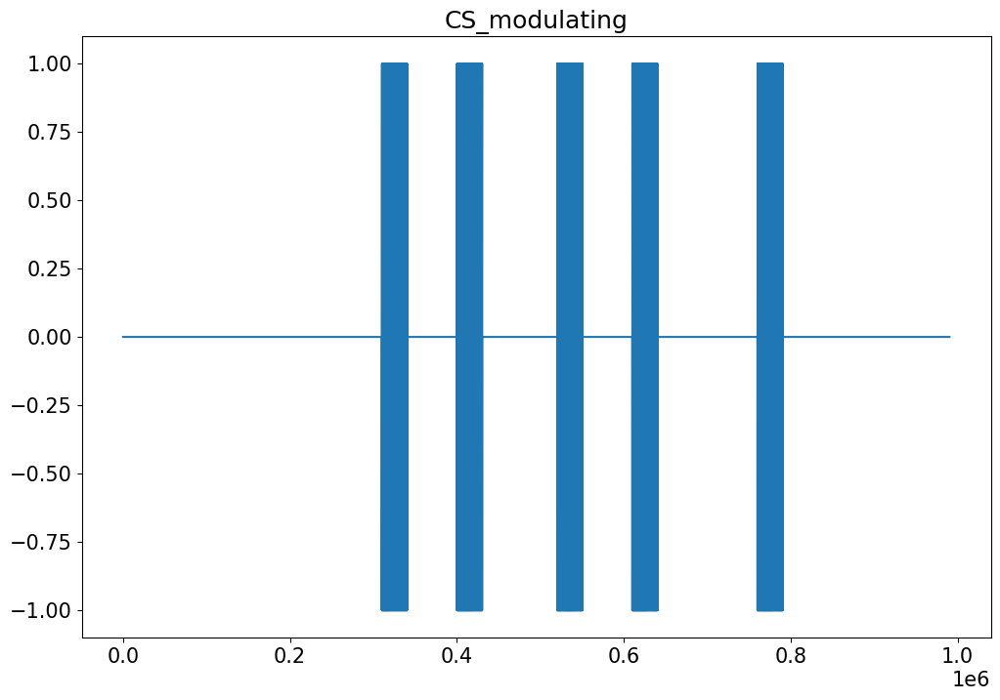

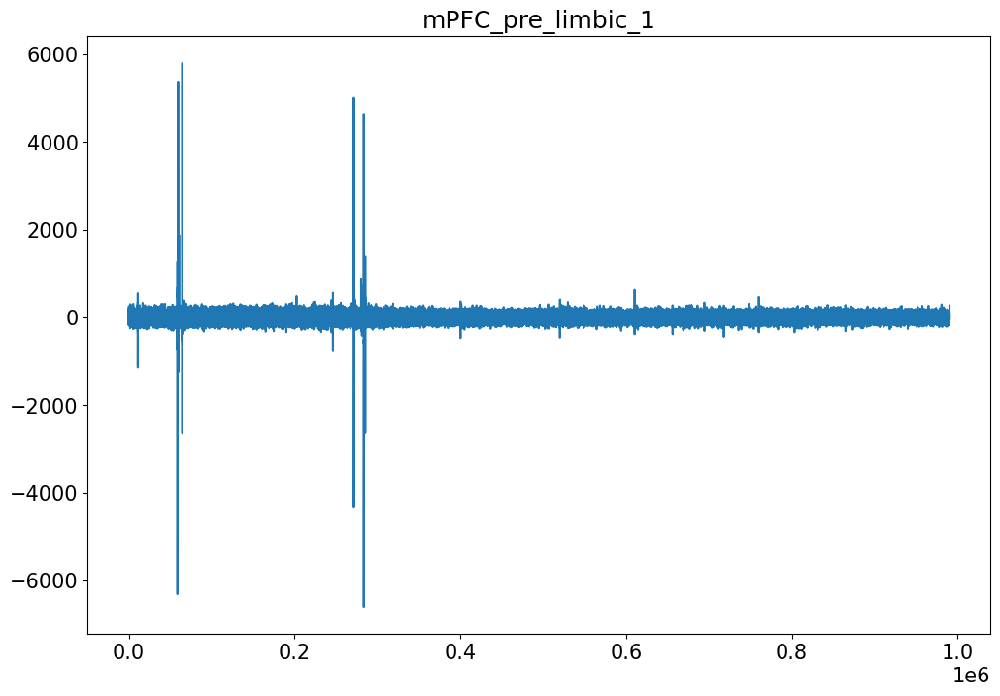

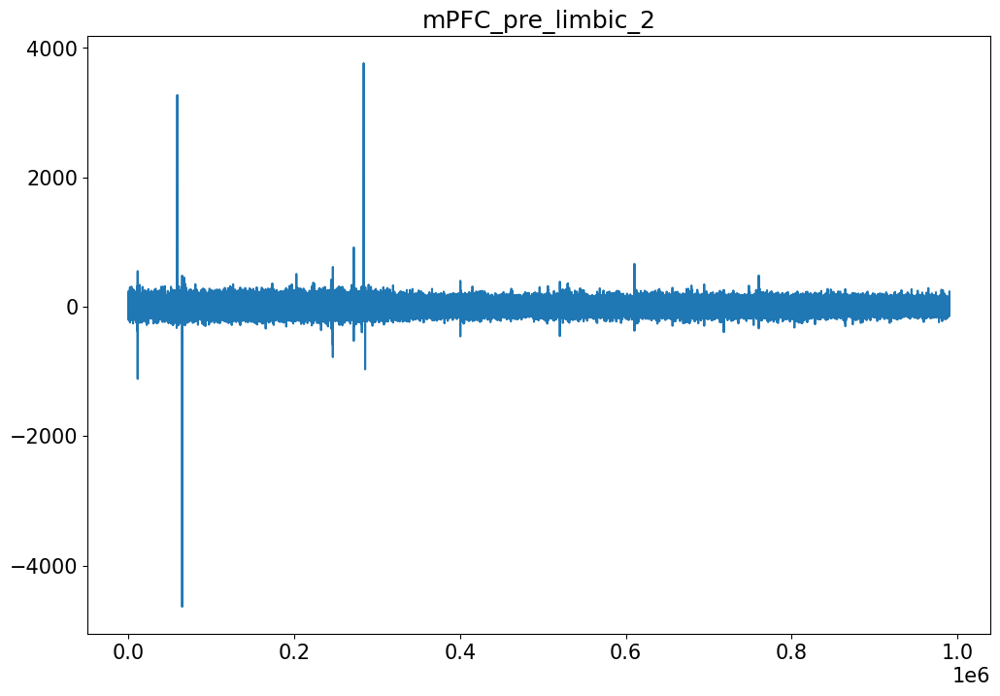

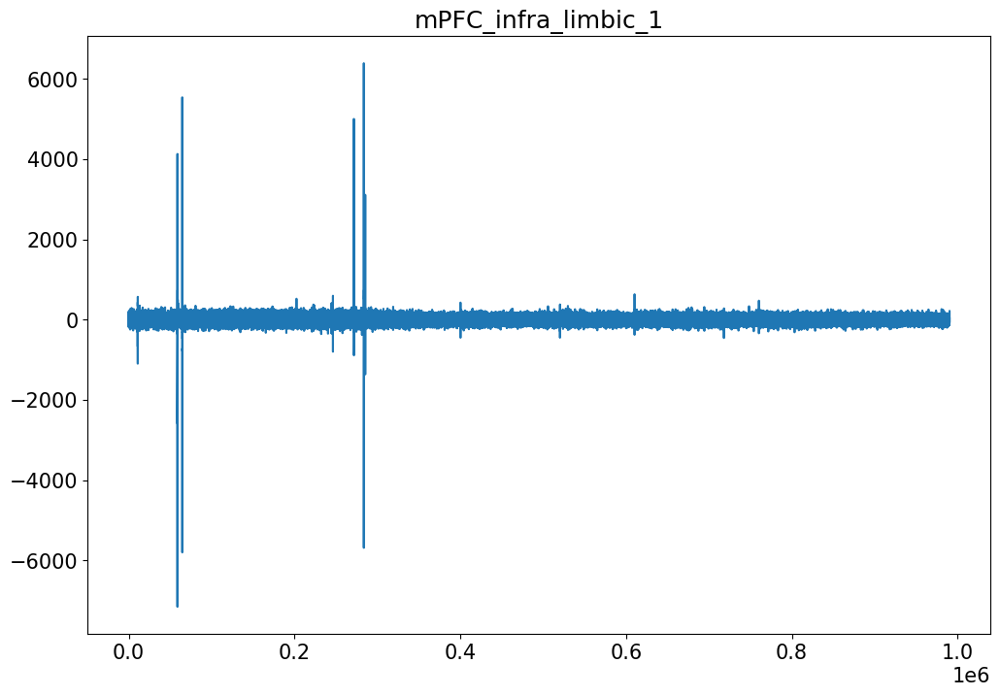

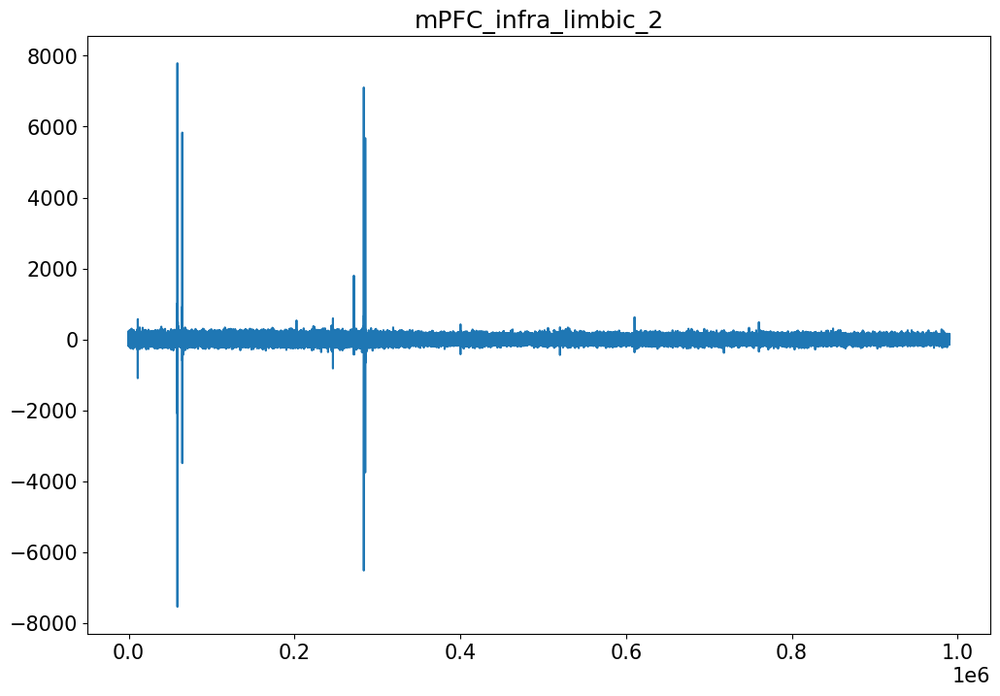

...

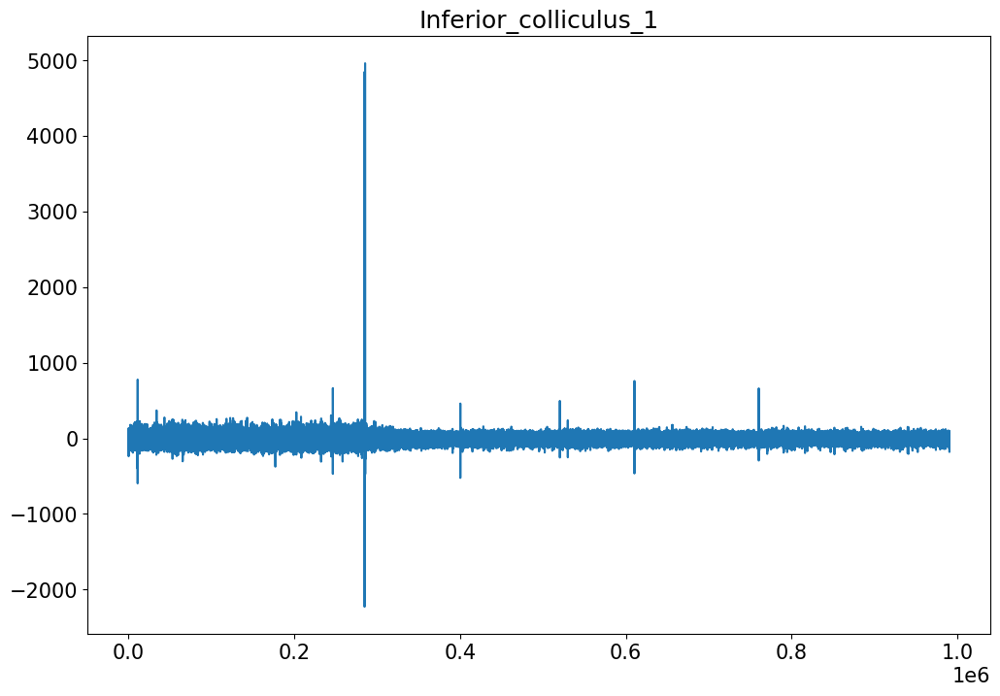

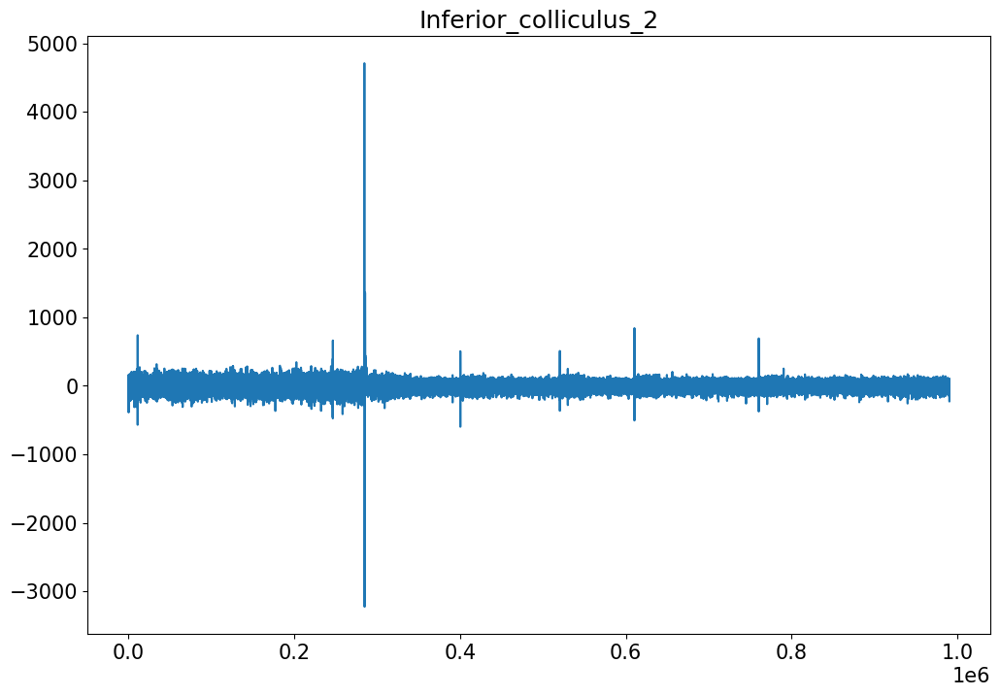

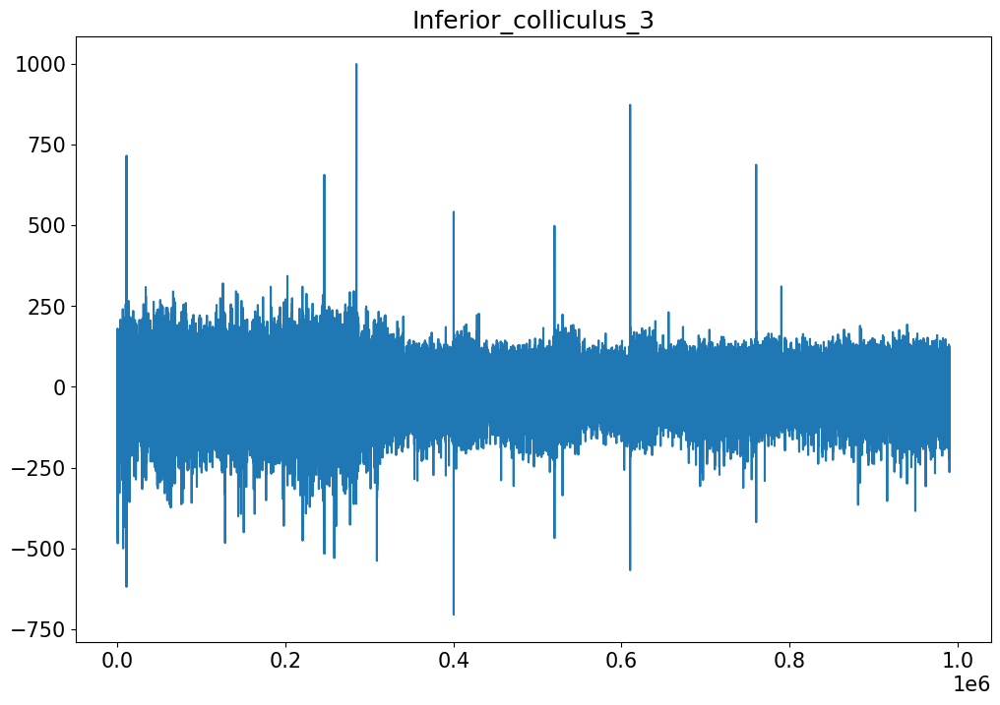

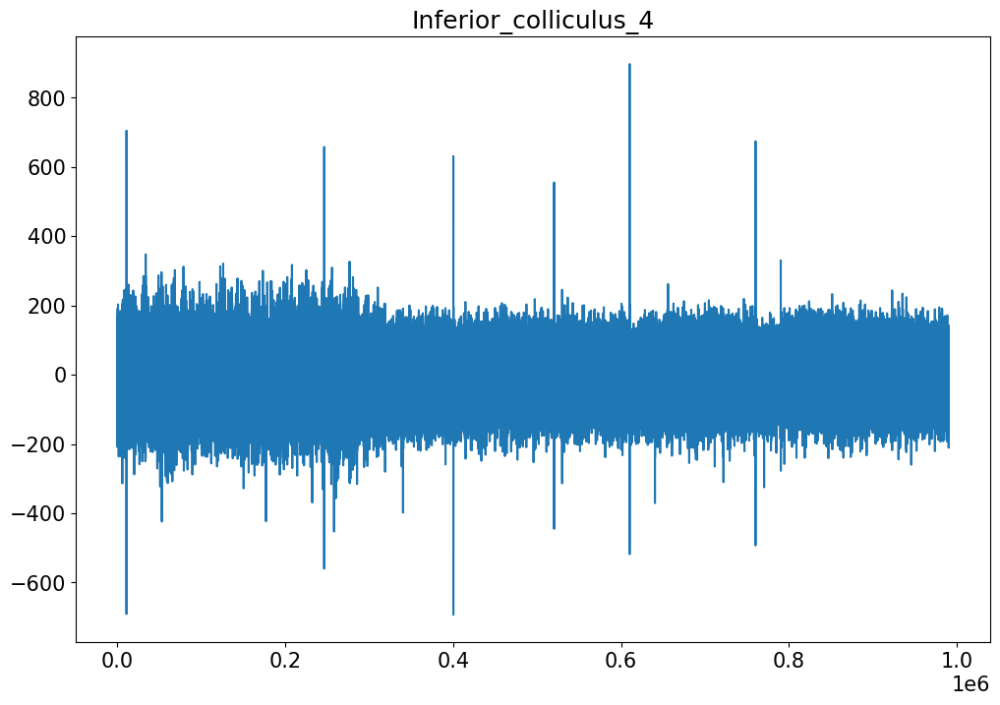

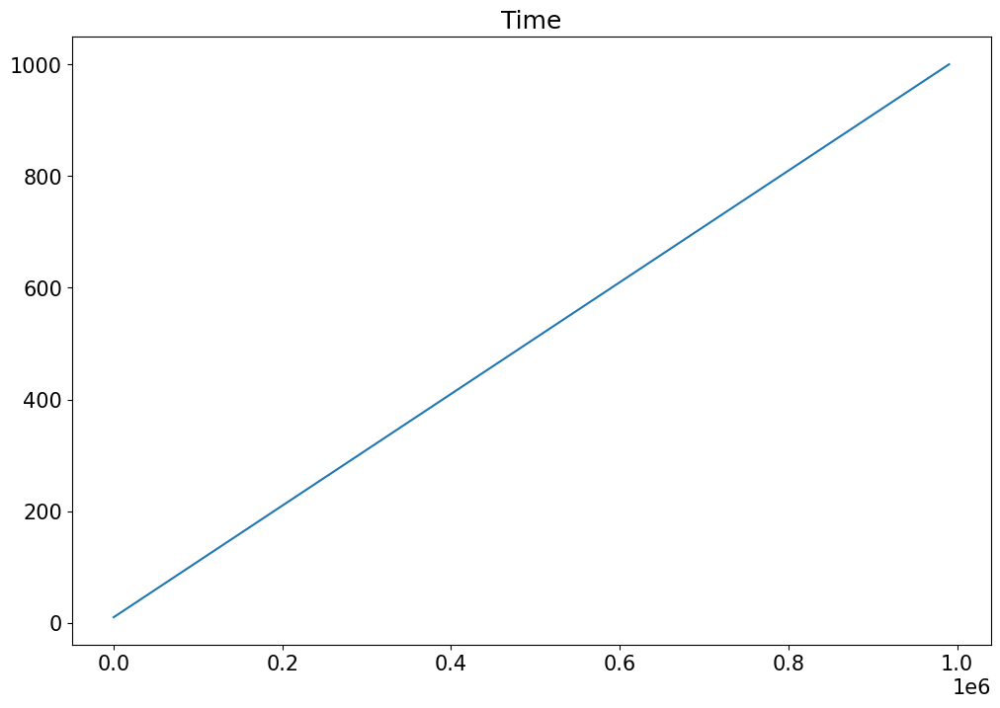

In [35]:
for column in data.columns:
    data.loc[:, column].plot()
    plt.title(column)
    plt.show()


Event: 1
index start: 310187
index end: 340268
time start: 320.18699999982806
time end: 350.2679999998114
time duration: 30.081

Event: 2
index start: 400188
index end: 430269
time start: 410.1879999997782
time end: 440.26899999976155
time duration: 30.081

Event: 3
index start: 520189
index end: 550270
time start: 530.1889999997117
time end: 560.2699999996951
time duration: 30.081

Event: 4
index start: 610190
index end: 640271
time start: 620.1899999996618
time end: 650.2709999996451
time duration: 30.081

Event: 5
index start: 760191
index end: 790271
time start: 770.1909999995787
time end: 800.270999999562
time duration: 30.080000000000002

len(indices) = 10


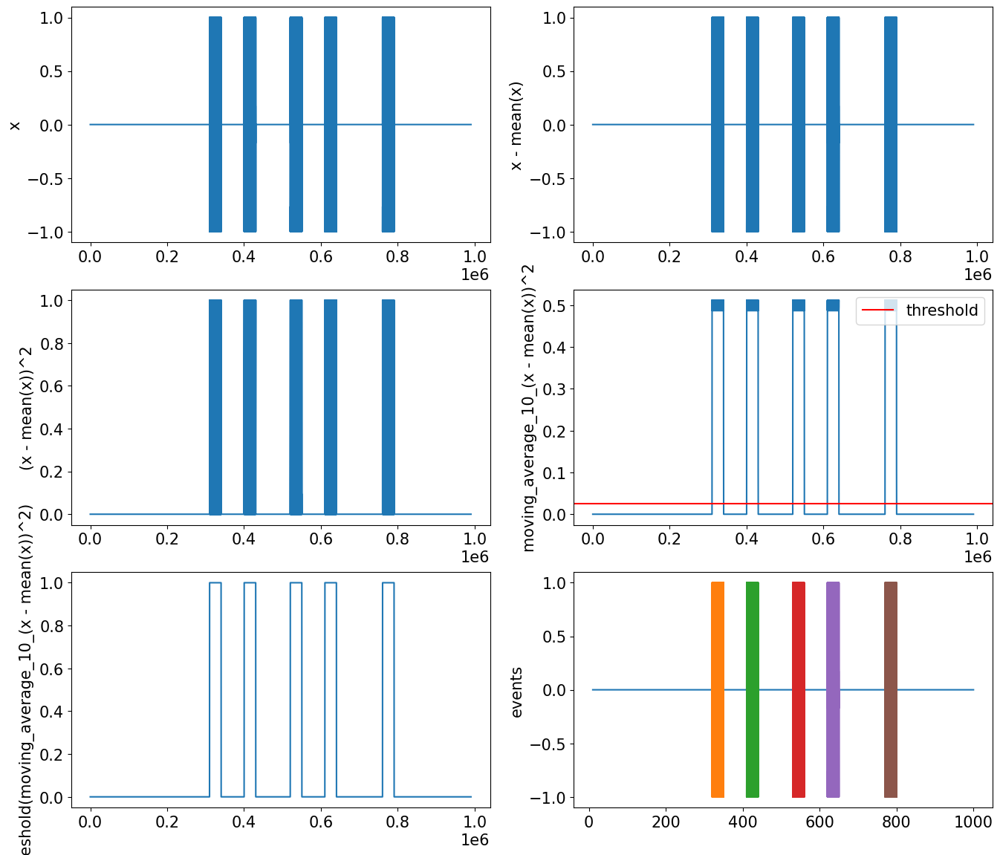

In [36]:
threshold = 0.025
window_size = 100

data = get_events(
    data=data, 
    threshold=threshold, 
    window_size=window_size, 
    time_sampling=TimeSampling
)

In [37]:
base_interval_1: tuple[int, float, float] = (1, 260.0, 290.0)
base_interval_2: tuple[int, float, float] = (2, 480.0, 510.0)
base_interval_3: tuple[int, float, float] = (3, 810.0, 840.0)
    
for base_index, time_start, time_end in [base_interval_1, base_interval_2, base_interval_3]:
    data.loc[(data.Time >= time_start)&(data.Time <= time_end), "event"] = f"base_{base_index}"

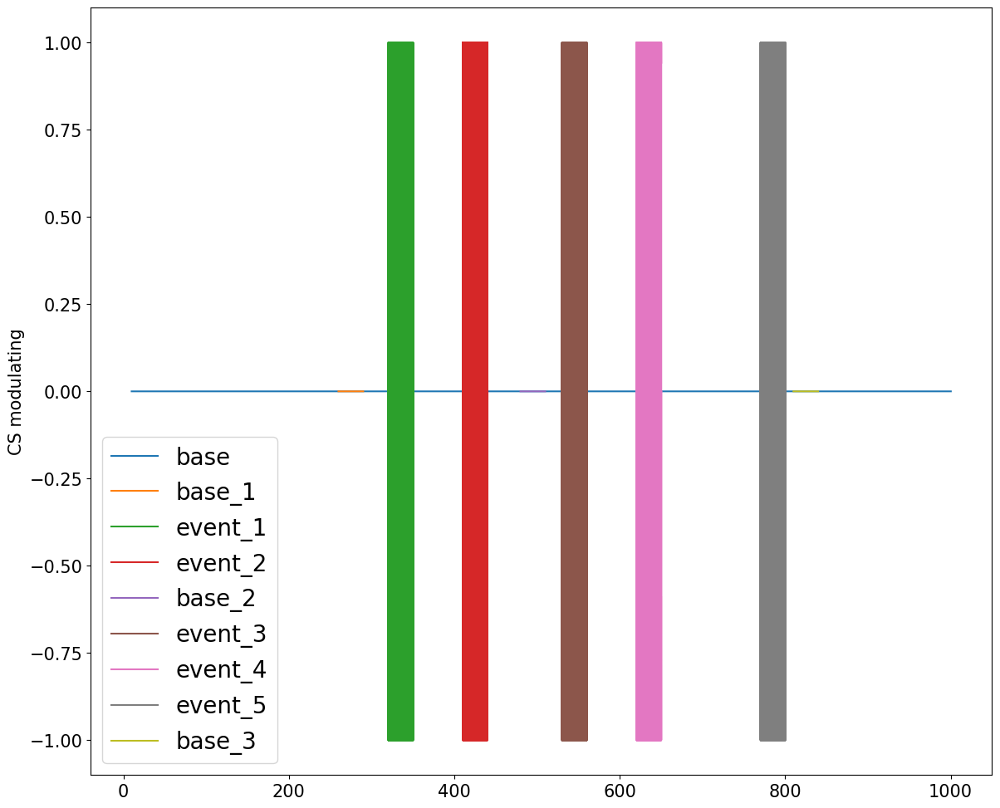

In [38]:
plt.figure(figsize=(14,12))

for event in data.event.unique():
    plt.plot(data.loc[data.event==event, "Time"], data.loc[data.event==event, "CS_modulating"], label=event)
plt.legend(loc='lower left', prop={'size': 20})
plt.ylabel("CS modulating")

plt.show()

# Data filtering

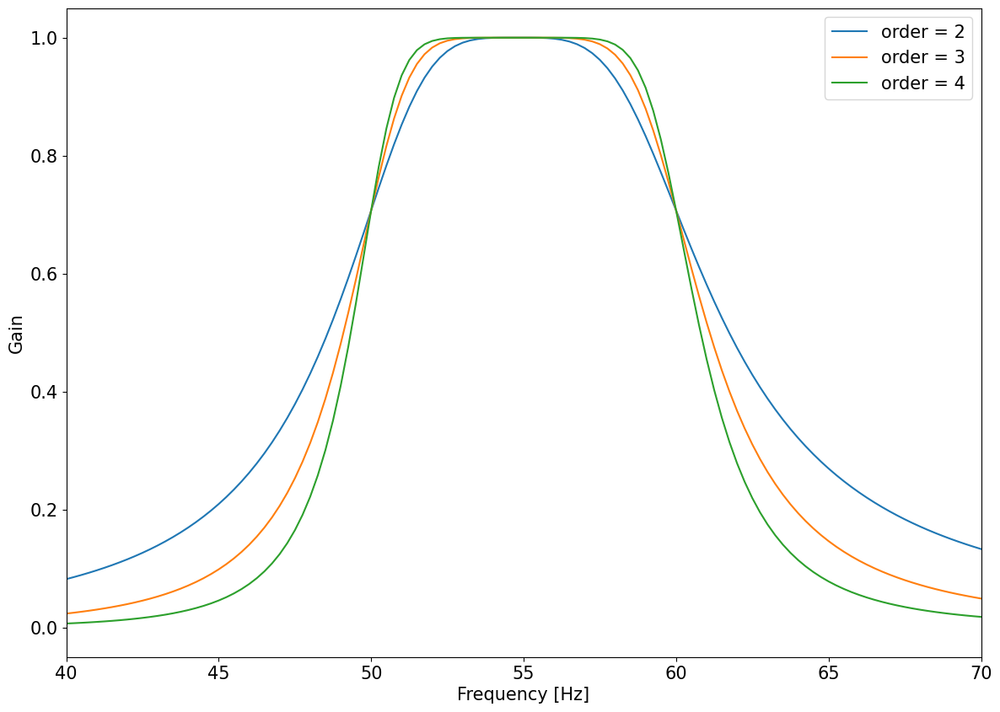

In [39]:
low_cut_hz = 50
high_cut_hz = 60
fs = 1.0/TimeSampling

plt.figure(figsize=(14,10))
plt.clf()

for order in range(2,5):
    b, a = butter_bandpass(low_cut_hz, high_cut_hz, fs, order=order)
    w, h = signal.freqz(b, a, fs=fs, worN=2000)
    plt.plot(w, abs(h), label="order = %d" % order)


plt.xlabel('Frequency [Hz]')
plt.ylabel('Gain')
plt.legend()
plt.xlim([low_cut_hz-10, high_cut_hz+10])
plt.show()

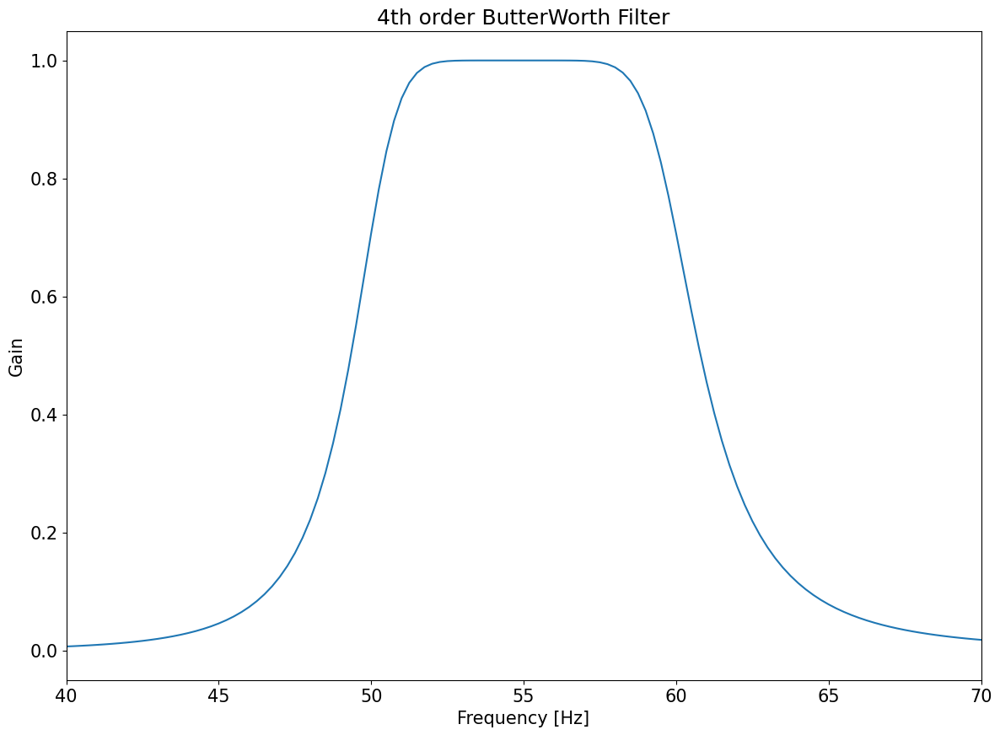

In [40]:
filter_order = 4
b, a = butter_bandpass(low_cut_hz, high_cut_hz, fs=fs, order=filter_order)

plt.figure(figsize=(14,10))
plt.clf()
w, h = signal.freqz(b, a, fs=fs, worN=2000)
plt.plot(w, abs(h))
plt.xlabel('Frequency [Hz]')
plt.ylabel('Gain')
plt.xlim([low_cut_hz-10, high_cut_hz+10])
plt.title(f"{filter_order}th order ButterWorth Filter")
plt.show()

## Filtering using filtfilt to avoid phase changes

## Filtering data

In [41]:
data.columns

Index(['CS_modulating', 'mPFC_pre_limbic_1', 'mPFC_pre_limbic_2',
       'mPFC_infra_limbic_1', 'mPFC_infra_limbic_2', 'Hippocampus_CA1',
       'Hippocampus_MOL_layer', 'Hippocampus_GD_1', 'Hippocampus_GD_2',
       'Amygdala_lateral_1', 'Amygdala_lateral_2', 'Amygdala_basolateral_1',
       'Amygdala_basolateral_2', 'Inferior_colliculus_1',
       'Inferior_colliculus_2', 'Inferior_colliculus_3',
       'Inferior_colliculus_4', 'Time', 'event'],
      dtype='object')

In [42]:
for channel_number in range(1, 5):
    logger.info(f"Filtering the Inferior colliculus {channel_number}")
    data = data.assign(
        **{
            f"filtered_Inferior_colliculus_{channel_number}": filter_function(data.loc[:, f"Inferior_colliculus_{channel_number}"].to_numpy())
        }
    )
    
for channel_number in range(1, 3):
    
    logger.info(f"Filtering the Amygdala lateral {channel_number}")
    data = data.assign(
        **{
            f"filtered_Amygdala_lateral_{channel_number}": filter_function(data.loc[:, f"Amygdala_lateral_{channel_number}"].to_numpy())
        }
    )
    
    logger.info(f"Filtering the Amygdala basolateral {channel_number}")
    data = data.assign(
        **{
            f"filtered_Amygdala_basolateral_{channel_number}": filter_function(data.loc[:, f"Amygdala_basolateral_{channel_number}"].to_numpy())
        }
    )

logger.success(f"Done filtering!")

2023-09-05 01:08:28.552 | INFO     | __main__:<module>:2 - Filtering the Inferior colliculus 1
2023-09-05 01:08:28.606 | INFO     | __main__:<module>:2 - Filtering the Inferior colliculus 2
2023-09-05 01:08:28.821 | INFO     | __main__:<module>:2 - Filtering the Inferior colliculus 3
2023-09-05 01:08:28.956 | INFO     | __main__:<module>:2 - Filtering the Inferior colliculus 4
2023-09-05 01:08:29.084 | INFO     | __main__:<module>:11 - Filtering the Amygdala lateral 1
2023-09-05 01:08:29.214 | INFO     | __main__:<module>:18 - Filtering the Amygdala basolateral 1
2023-09-05 01:08:29.347 | INFO     | __main__:<module>:11 - Filtering the Amygdala lateral 2
2023-09-05 01:08:29.506 | INFO     | __main__:<module>:18 - Filtering the Amygdala basolateral 2
2023-09-05 01:08:29.657 | SUCCESS  | __main__:<module>:25 - Done filtering!


## Decimation

In [43]:
desired_frequency_sampling = 250

data, TimeSampling, FrequencySampling = decimate(
    data=data, 
    desired_frequency_sampling=desired_frequency_sampling,
    filter_antialiasing=True,
    columns_to_exclude=["Time", "event"]
)

data_backup = data

2023-09-05 01:08:29.668 | INFO     | __main__:decimate:18 - The time sampling is 0.001 seconds and the frequency is 1.0 kHz
2023-09-05 01:08:29.668 | INFO     | __main__:decimate:23 - The data will be decimated by the rate 1:4
2023-09-05 01:08:30.547 | INFO     | __main__:decimate:42 - The new time sampling is 0.004 s and the new frequency is 250.0 Hz


In [44]:
data = data_backup

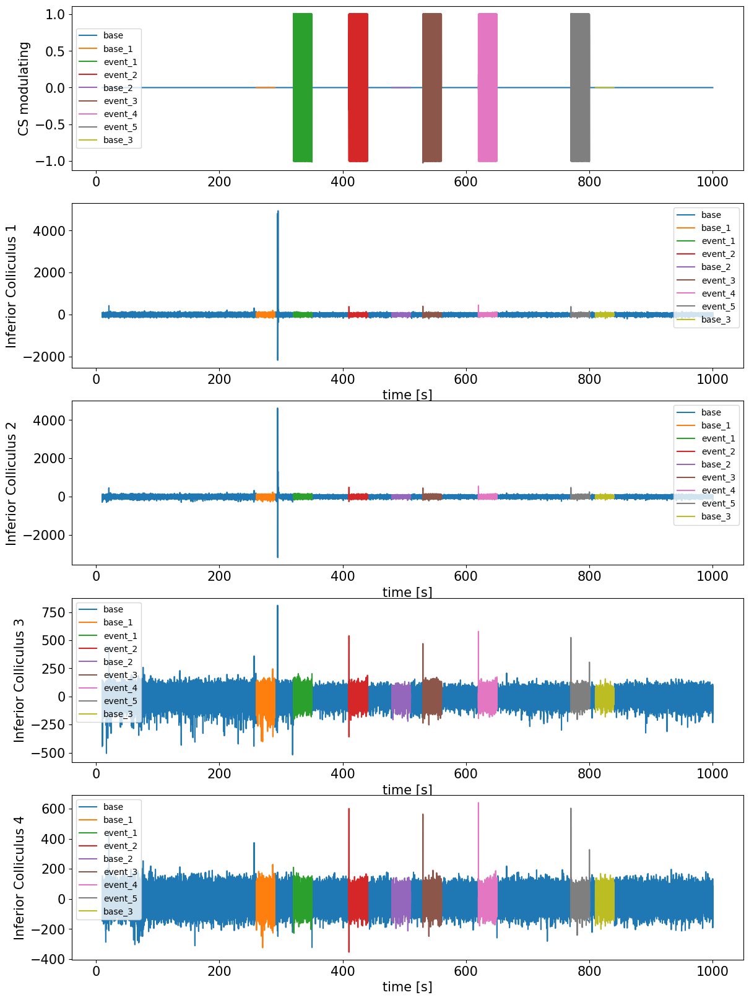

In [45]:
plt.figure(figsize=(14,20))

plt.subplot(511)
for event in data.event.unique():
    plt.plot(data.loc[data.event==event, "Time"], data.loc[data.event==event, "CS_modulating"], label=event)
plt.legend(loc=6, prop={'size': 10})
plt.ylabel("CS modulating")

plt.subplot(512)
for event in data.event.unique():
    plt.plot(data.loc[data.event==event, "Time"], data.loc[data.event==event, "Inferior_colliculus_1"], label=event)
plt.xlabel("time [s]")
plt.ylabel("Inferior Colliculus 1")
plt.legend(prop={'size': 10})

plt.subplot(513)
for event in data.event.unique():
    plt.plot(data.loc[data.event==event, "Time"], data.loc[data.event==event, "Inferior_colliculus_2"], label=event)
plt.xlabel("time [s]")
plt.ylabel("Inferior Colliculus 2")
plt.legend(prop={'size': 10})

plt.subplot(514)
for event in data.event.unique():
    plt.plot(data.loc[data.event==event, "Time"], data.loc[data.event==event, "Inferior_colliculus_3"], label=event)
plt.xlabel("time [s]")
plt.ylabel("Inferior Colliculus 3")
plt.legend(prop={'size': 10})

plt.subplot(515)
for event in data.event.unique():
    plt.plot(data.loc[data.event==event, "Time"], data.loc[data.event==event, "Inferior_colliculus_4"], label=event)
plt.xlabel("time [s]")
plt.ylabel("Inferior Colliculus 4")
plt.legend(prop={'size': 10})

plt.show()

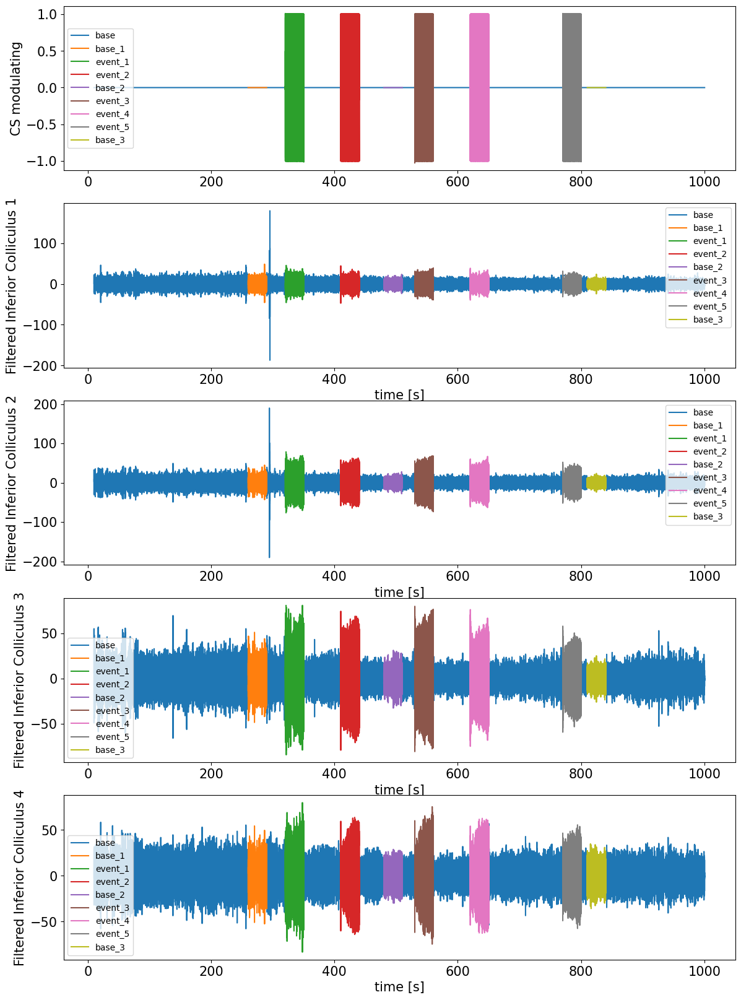

In [46]:
plt.figure(figsize=(14,20))

plt.subplot(511)
for event in data.event.unique():
    plt.plot(data.loc[data.event==event, "Time"], data.loc[data.event==event, "CS_modulating"], label=event)
plt.legend(loc=6, prop={'size': 10})
plt.ylabel("CS modulating")

plt.subplot(512)
for event in data.event.unique():
    plt.plot(data.loc[data.event==event, "Time"], data.loc[data.event==event, "filtered_Inferior_colliculus_1"], label=event)
plt.xlabel("time [s]")
plt.ylabel("Filtered Inferior Colliculus 1")
plt.legend(prop={'size': 10})

plt.subplot(513)
for event in data.event.unique():
    plt.plot(data.loc[data.event==event, "Time"], data.loc[data.event==event, "filtered_Inferior_colliculus_2"], label=event)
plt.xlabel("time [s]")
plt.ylabel("Filtered Inferior Colliculus 2")
plt.legend(prop={'size': 10})

plt.subplot(514)
for event in data.event.unique():
    plt.plot(data.loc[data.event==event, "Time"], data.loc[data.event==event, "filtered_Inferior_colliculus_3"], label=event)
plt.xlabel("time [s]")
plt.ylabel("Filtered Inferior Colliculus 3")
plt.legend(prop={'size': 10})

plt.subplot(515)
for event in data.event.unique():
    plt.plot(data.loc[data.event==event, "Time"], data.loc[data.event==event, "filtered_Inferior_colliculus_4"], label=event)
plt.xlabel("time [s]")
plt.ylabel("Filtered Inferior Colliculus 4")
plt.legend(prop={'size': 10})

plt.show()

# Selecting Data to model - EVENT 1

In [47]:
event_number = 1
id_results: str = f"event_{event_number}"

event_data = select_event_window(
    df=data_backup, 
    event_name=f"event_{event_number}", 
    samples_before=0, 
    samples_after=0
)

In [48]:
u = np.vstack([event_data.loc[:, dict_inputs[input_model]] for input_model in inputs]) if len(inputs) > 1 else event_data.loc[:, dict_inputs[inputs[0]]]

In [49]:
path_files = f"err_model_{id_file}_{id_results}_err.pkl"
err_already_calculated: bool = os.path.isfile(path_files)

if err_already_calculated and not replace_err:
    logger.info("ERR already calculated. Loading...")
    err_out, termos, psi = load_err()
    logger.success("ERR loaded!")
else:
    logger.info("ERR not calculated yet. Generating ERR...")

2023-09-05 01:08:39.098 | INFO     | __main__:<module>:5 - ERR already calculated. Loading...
2023-09-05 01:08:39.099 | INFO     | __main__:load_err:5 - loading err...
2023-09-05 01:08:39.099 | INFO     | __main__:load_err:9 - loading termos...
2023-09-05 01:08:39.100 | INFO     | __main__:load_err:13 - loading psi...
2023-09-05 01:08:39.101 | SUCCESS  | __main__:load_err:17 - Done loading err data!
2023-09-05 01:08:39.102 | SUCCESS  | __main__:<module>:7 - ERR loaded!


In [50]:
y = event_data.Inferior_colliculus_2.to_numpy()

### Obtendo o resultado do Critério de Redução de Erro 

In [51]:
if not err_already_calculated or replace_err:

    err_obj = err(
        ny=max_y_delays,
        nu=max_u_delays,
        n_lin=degree_of_non_linearity,
        yid=y,
        uid=u,
        cte=True,
    )

    start_time = perf_counter()

    err_out, termos, psi = err_obj.run(print_result=True)

    end_time = perf_counter()

    save_err(err_out, termos, psi)

In [52]:
err_out

{'ordem': array([ 6, 35, 49,  1,  4, 10,  0, 51, 63, 17, 24, 30,  3, 61, 60, 59, 32,
        47, 15, 57, 58, 62, 64, 26, 65, 34, 19, 31, 27, 56, 20,  8, 11, 46,
        25, 54, 16, 22, 29, 45, 48, 39, 14, 36,  2, 52, 23, 13, 41, 38, 53,
        37, 43, 21, 28, 55,  7, 50, 33, 44, 12, 42, 18,  9,  5, 40]),
 'valor': array([2.66728047e-01, 3.20144133e-03, 6.05236444e-04, 3.56008647e-04,
        2.60201241e-03, 4.12534229e-04, 3.29815735e-04, 4.76808508e-04,
        1.51246027e-03, 1.98006443e-04, 3.42363178e-04, 3.09719180e-04,
        8.62000136e-05, 4.47102221e-05, 9.96870269e-04, 4.92468241e-04,
        1.10228201e-03, 2.15771473e-04, 6.67015777e-05, 9.06016562e-05,
        1.21081218e-04, 6.93440079e-05, 7.41927679e-05, 1.26691376e-04,
        5.25453204e-05, 2.59741076e-04, 4.30222069e-05, 2.56390619e-05,
        4.37088609e-05, 1.67585998e-05, 3.84272639e-05, 2.39975920e-05,
        1.87402611e-05, 2.19050619e-05, 2.74225565e-05, 1.88514680e-05,
        2.75312282e-05, 5.65790148e-

In [53]:
termos

,u(k-9),u(k-8),u(k-7),u(k-6),u(k-5),u(k-4),u(k-3),u(k-2),u(k-1),u(k-0)
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...
61,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0
62,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0
63,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0
64,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,0.0


In [54]:
psi

array([[ 1.00000000e+00,  5.08709609e-02, -3.00826202e-02, ...,
         2.56167644e-06,  0.00000000e+00,  0.00000000e+00],
       [ 1.00000000e+00, -9.75407290e-02,  5.08709609e-02, ...,
         8.91244741e-06,  2.56167644e-06,  0.00000000e+00],
       [ 1.00000000e+00,  4.02592564e-01, -9.75407290e-02, ...,
         1.43547957e-05,  8.91244741e-06,  2.56167644e-06],
       ...,
       [ 1.00000000e+00, -2.73995983e-03,  3.47009902e-03, ...,
         8.85825693e-03,  1.57242642e-01,  4.49445800e-01],
       [ 1.00000000e+00,  1.62891118e-03, -2.73995983e-03, ...,
         2.39377772e-03,  8.85825693e-03,  1.57242642e-01],
       [ 1.00000000e+00,  0.00000000e+00,  1.62891118e-03, ...,
         8.25829604e-04,  2.39377772e-03,  8.85825693e-03]])

### Obtendo o Critério de Informação de Akaike para a matriz $\Psi$ gerada pelo ERR

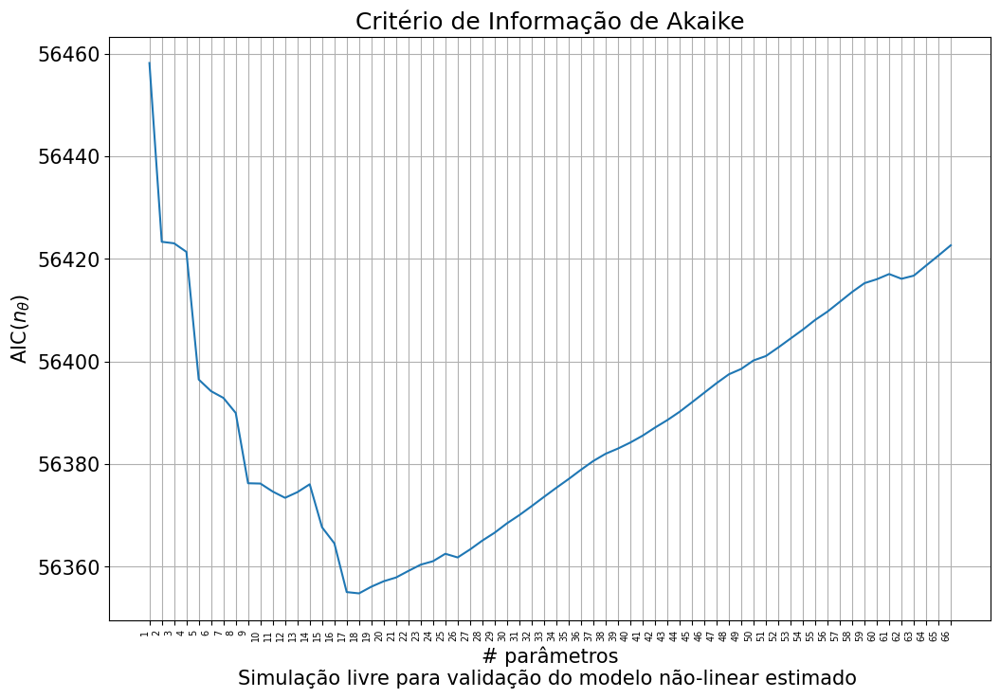

In [55]:
Phi = np.array([])

aic = np.array([])
parameters = np.array([])

for i in range(len(psi.T)):
    
    if i == 0:
        Phi = psi[:,err_out["ordem"][i]][None]
    else:
        Phi = np.vstack([Phi, psi[:,err_out["ordem"][i]]])  
            
    thetaMQ, residuos = MQ(Phi.T, y[max_delays:])
    
    var_xi = np.var(residuos)
    
    n_theta = len(thetaMQ)
    
    aic = np.append(aic, AIC(n_theta, len(y), var_xi))
    
    parameters = np.append(parameters, i+1)
    
max_number_of_parameters = 100  # float("Inf")
plt.plot(parameters[parameters<=max_number_of_parameters], aic[parameters<=max_number_of_parameters])
plt.title("Critério de Informação de Akaike")
xlabel = "# parâmetros"
caption = f"Simulação livre para validação do modelo não-linear estimado "
plt.xlabel(xlabel+"\n"+caption)
plt.ylabel("AIC($n_{\\theta}$)")
plt.xticks(parameters[parameters<=max_number_of_parameters], rotation=90, ha='right', fontsize=7)
plt.grid()
plt.savefig(
    "akaike.png",
    format="png",
    bbox_inches='tight', 
    dpi=300
)
plt.show()

Considerando o Critério de Informação de Akaike, são escolhidos os 5 primeiros regressores listados, que consistem das combinações de número 1, 14, 7, 2 e 5, da tabela de termos mostrada abaixo:

In [56]:
number_of_selected_terms = 17

In [57]:
psi_mq = np.vstack([psi[:,i] for i in err_out["ordem"][:number_of_selected_terms]]).T

theta, xi = MQ(psi_mq, y[max_delays:])

print(f"Theta ordenado: {theta}")

Theta ordenado: [-10.9574655  -15.71548992 -34.44220435  14.28895678 -31.2575508
  19.32768657  86.33558546  19.03200122  36.91518354 -27.81919615
  34.67543084 -27.0025052    9.18137444 -61.50078517 -74.35582633
 -52.30632297 -61.53412871]


Assim, o modelo NARX escolhido é:

In [58]:
terms_dict = termos.iloc[err_out["ordem"][:number_of_selected_terms]].T.to_dict()

model = []
model_dict = {}
model_str = []

for reg_number, line in terms_dict.items():
    term = ""
    for reg, power in line.items():
        term += " * " if term and power else ""
        term += reg if power > 0 else ""
        term += f"**{int(power)}" if power > 1 else ""
    term += "1"*(not bool(term))
    term = term.replace("(", "[").replace(")", "]")
    model.append(term)
    model_dict[reg_number] = term
    
print("\n\nOrderedTermos:\n")

for i, term in enumerate(model_dict.values()):
    print(f"{str(i).zfill(2)}: err: {'{:e}'.format((err_out['valor'][:number_of_selected_terms])[i])} - {term}")
    

print("\n\nTermos:\n")

for line, term in model_dict.items():
    print(f"{line}: {term}")
    
terms_per_line = 4
print("\ny(k) = ", end="")
for i, term in enumerate(model, start=1):
    print(f"{term}{' + '*(i not in (len(model),))}", end="\n" if not i % terms_per_line else "")
    
print("\n\n\n")



OrderedTermos:

00: err: 2.667280e-01 - u[k-4]
01: err: 3.201441e-03 - u[k-6] * u[k-5]
02: err: 6.052364e-04 - u[k-4] * u[k-0]
03: err: 3.560086e-04 - u[k-9]
04: err: 2.602012e-03 - u[k-6]
05: err: 4.125342e-04 - u[k-0]
06: err: 3.298157e-04 - 1
07: err: 4.768085e-04 - u[k-3] * u[k-1]
08: err: 1.512460e-03 - u[k-2]**2
09: err: 1.980064e-04 - u[k-9] * u[k-2]
10: err: 3.423632e-04 - u[k-8] * u[k-3]
11: err: 3.097192e-04 - u[k-7] * u[k-4]
12: err: 8.620001e-05 - u[k-7]
13: err: 4.471022e-05 - u[k-4]**2
14: err: 9.968703e-04 - u[k-5]**2
15: err: 4.924682e-04 - u[k-6]**2
16: err: 1.102282e-03 - u[k-7] * u[k-2]


Termos:

6: u[k-4]
35: u[k-6] * u[k-5]
49: u[k-4] * u[k-0]
1: u[k-9]
4: u[k-6]
10: u[k-0]
0: 1
51: u[k-3] * u[k-1]
63: u[k-2]**2
17: u[k-9] * u[k-2]
24: u[k-8] * u[k-3]
30: u[k-7] * u[k-4]
3: u[k-7]
61: u[k-4]**2
60: u[k-5]**2
59: u[k-6]**2
32: u[k-7] * u[k-2]

y(k) = u[k-4] + u[k-6] * u[k-5] + u[k-4] * u[k-0] + u[k-9] + 
u[k-6] + u[k-0] + 1 + u[k-3] * u[k-1] + 
u[k-2]**2 + u[k-9]

## Validação utilizando a segunda metade da massa de dados:

In [59]:
y_free = eval_model_SISO_NARX(
    model=model, 
    theta=theta, 
    u=u.to_numpy(), 
    y=y, 
    y0=y[:max_delays]
)

Carregando a saída da validação e os resíduos de estimação do modelo cuja estrutura foi obtida no Livro-texto, na Lista de Exercícios 9 

## Plotando as curvas de validação

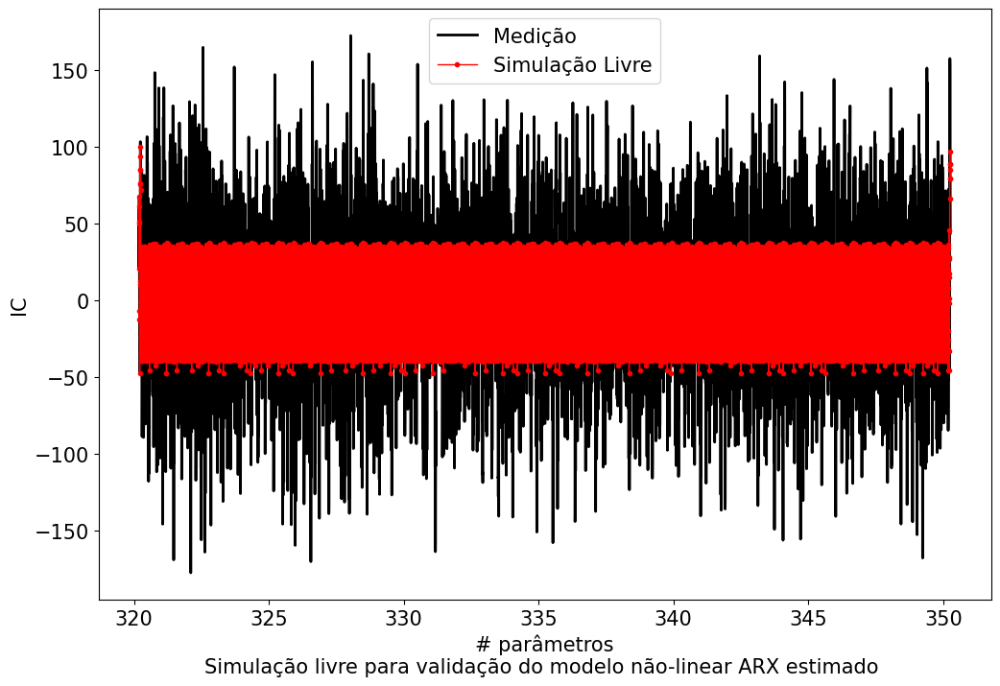

In [60]:
y_validacao = y_free
time_to_plot = event_data.Time.to_numpy()

plt.figure()
plt.plot(time_to_plot, y, linewidth=2, label="Medição", color='black')
plt.plot(time_to_plot, y_validacao ,marker='.',color = 'red', linewidth=1, label="Simulação Livre")
plt.legend()
plt.ylabel("IC")
caption = f"Simulação livre para validação do modelo não-linear ARX estimado "
plt.xlabel(xlabel+"\n"+caption)
plt.savefig(
    "simulacao_livre.png",
    format="png",
    bbox_inches='tight', 
    dpi=300
)
plt.show()

In [61]:
fig = make_subplots(rows=2, cols=1, subplot_titles=('Signal',  'Event'))

fig.update_layout(
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="black",
    legend_title_font_color="green",
    title="Model Free Simulation Validation",
)

fig.add_trace(go.Scatter(x=time_to_plot, y=y, name="signal"), row=1, col=1)
fig.add_trace(go.Scatter(x=time_to_plot, y=y_validacao, name="model"), row=2, col=1)

fig.show()

Ambos os modelos apresentaram curvas estáticas similares e não serão apresentadas neste trabalho por já constarem nas listas de Exercícios anteriores.

#### Cálculo do RMSD

In [62]:
rmsd = RMSD(y, y_validacao)

print(f"RMSD Modelo Estimado ({len(theta)} parâmetros): {np.round(rmsd, 5)}")

RMSD Modelo Estimado (17 parâmetros): 65.9302


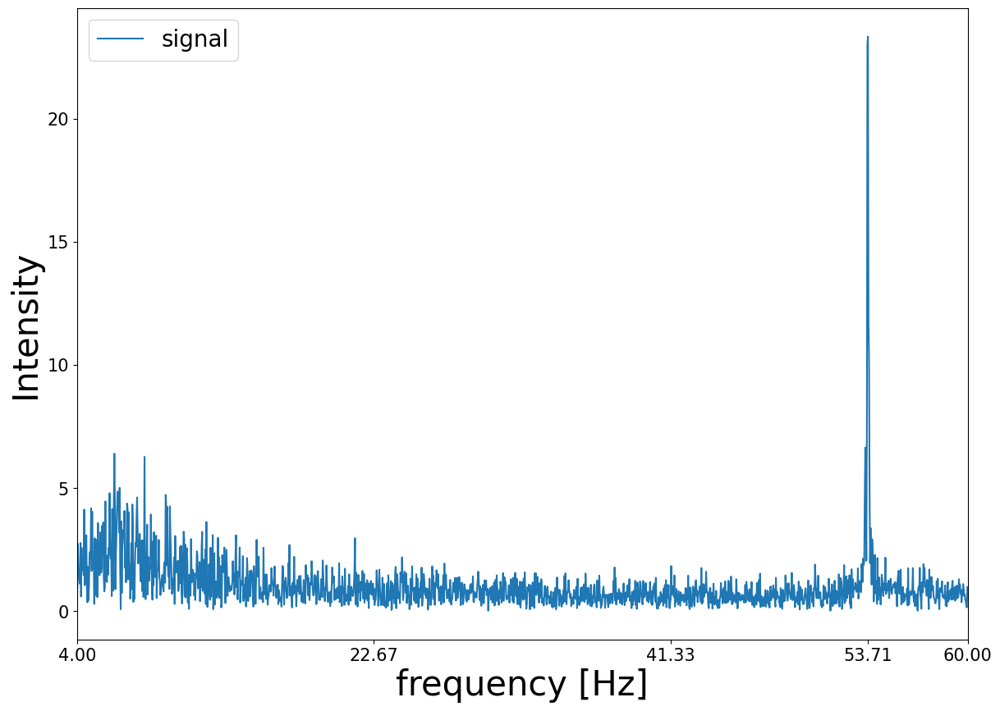

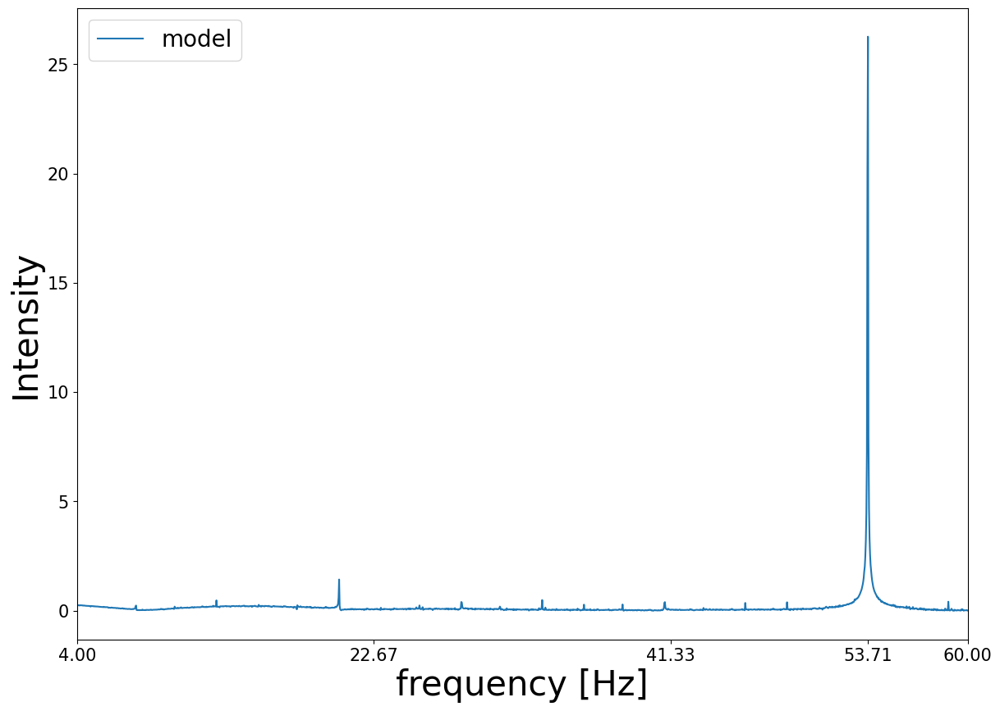

In [63]:
y = y_signal = event_data.Inferior_colliculus_2.to_numpy()

lim = (4, 60)
ymin = float("Inf")
ymax = float("-Inf")
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

colors = ["black", "orange", "red", "green", "blue"]

fft_data = {
    "signal": y,
    "model": y_validacao
}

for name_data, data in fft_data.items():
    fig = plt.figure(figsize=(14,10))

    ax = fig.add_subplot(111)

    frequency, intensity, angle = fft(x=data, fs=FrequencySampling)
    y = (intensity)[(frequency>=lim[0])&(frequency<=lim[1])]
    x = (frequency)[(frequency>=lim[0])&(frequency<=lim[1])]
    
    ax.plot(x, y, label=f"{name_data}")
    
    ax.set_xlabel("frequency [Hz]", fontsize=30)
    ax.set_ylabel('Intensity', fontsize=30)
    t = ax.yaxis.get_offset_text()
    t.set_size(20)
    
    plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 4), [53.71])), fontsize=15)
    plt.xlim([lim[0], lim[1]])
    plt.legend(prop={'size': 20})
    plt.savefig(
        f"FFT_{id_file}_{name_data}.jpg",
        format="jpg",
        bbox_inches='tight', 
        dpi=150
    )

    plt.show()


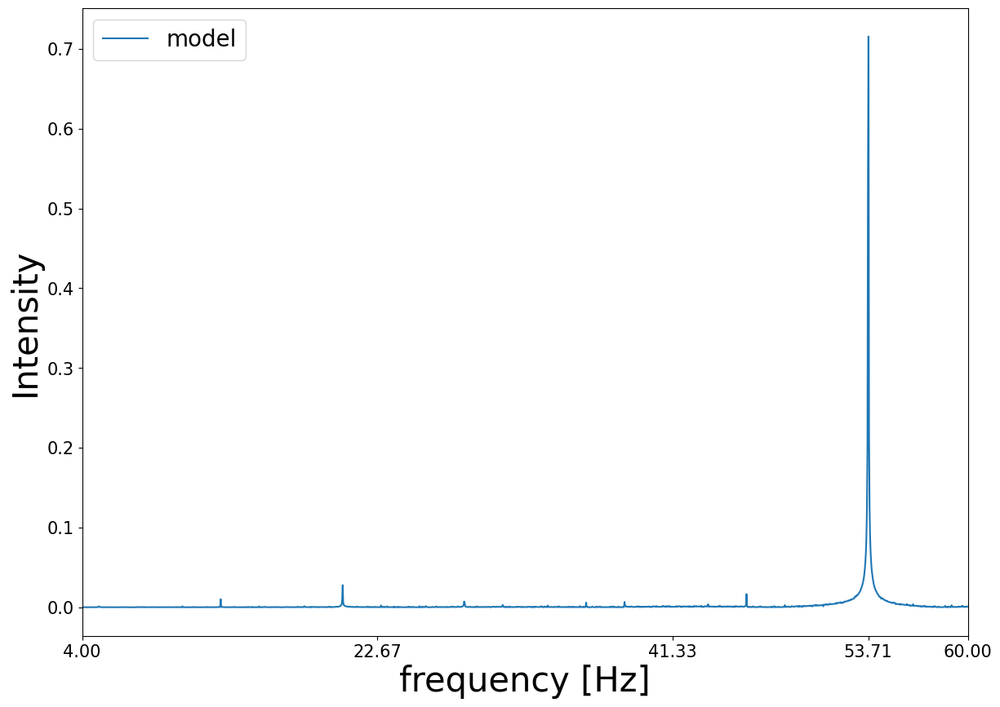

In [64]:

fig = plt.figure(figsize=(14,10))

ax = fig.add_subplot(111)

frequency, intensity, angle = fft(x=u, fs=FrequencySampling)
y = (intensity)[(frequency>=lim[0])&(frequency<=lim[1])]
x = (frequency)[(frequency>=lim[0])&(frequency<=lim[1])]

ax.plot(x, y, label=f"{name_data}")

ax.set_xlabel("frequency [Hz]", fontsize=30)
ax.set_ylabel('Intensity', fontsize=30)
t = ax.yaxis.get_offset_text()
t.set_size(20)

plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 4), [53.71])), fontsize=15)
plt.xlim([lim[0], lim[1]])
plt.legend(prop={'size': 20})
plt.savefig(
    f"FFT_{id_file}_{name_data}.jpg",
    format="jpg",
    bbox_inches='tight', 
    dpi=150
)

plt.show()

In [65]:
path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
load_already_calculated: bool = os.path.isfile(path_files)

hosa_df = None

if load_already_calculated and not replace_hosa:
    logger.info("HOSA already calculated. Loading...")
    hosa_df = pd.read_csv(path_files)
    logger.success("HOSA loaded!")

else:
    logger.info("HOSA not calculated yet. Generating hosa...")

2023-09-05 01:08:44.107 | INFO     | __main__:<module>:7 - HOSA already calculated. Loading...
2023-09-05 01:08:44.126 | SUCCESS  | __main__:<module>:9 - HOSA loaded!


In [66]:
if (not load_already_calculated or replace_hosa) and generate_hosa:

    frequency_array = np.arange(start=4, stop=60, step=0.01)

    TDQS_PARAMETERS = {
        "frequency_array": frequency_array,
        "phase_step": 0.01
    }

    df_amps = pd.DataFrame()
    df_phases = pd.DataFrame()
    
    df_amps_model = pd.DataFrame()
    df_phases_model = pd.DataFrame()

    df_amps_signal = pd.DataFrame()
    df_phases_signal = pd.DataFrame()

    logger.info("Processing the tdqs... This may take a while...\n")
    start_time = perf_counter()

    # Process the tdts for each channel, in parallel

    tdqs_object = TDQS(
        frequency_sampling=FrequencySampling,
        frequency_array=TDQS_PARAMETERS.get("frequency_array"),
        fmin=None,
        fmax=None,
        freq_step=None,
        phase_step=TDQS_PARAMETERS["phase_step"]
    )

    f = lambda x: tdqs_object.run_td4spectrum(x)

    with Pool() as pool:

        for result in pool.map(
            f, 
            [
                {
                    signal_name: signal_array
                } for signal_name, signal_array in {"signal": y_signal, "model": y_validacao}.items()
            ]
        ):

            signal_name, result_data = list(result.items())[0]
            (
                frequency_array, 
                spectrum, 
                phase_spectrum, 
                bispectrum, 
                phase_bispectrum, 
                trispectrum, 
                phase_trispectrum,
                tetraspectrum,
                phase_tetraspectrum         
            ) = result_data

            if "frequency" not in df_amps.columns:
                df_amps = df_amps.assign(frequency=frequency_array)
            if "frequency" not in df_amps_signal.columns:
                df_amps_signal = df_amps_signal.assign(frequency=frequency_array)
            if "frequency" not in df_amps_model.columns:
                df_amps_model = df_amps_model.assign(frequency=frequency_array)

            df_amps = df_amps.assign(**{f"tds_amp_{signal_name}": spectrum})
            df_phases = df_phases.assign(**{f"tds_phase_{signal_name}": phase_spectrum})

            df_amps = df_amps.assign(**{f"tdbs_amp_{signal_name}": bispectrum})
            df_phases = df_phases.assign(**{f"tdbs_phase_{signal_name}": phase_bispectrum})

            df_amps = df_amps.assign(**{f"tdts_amp_{signal_name}": trispectrum})
            df_phases = df_phases.assign(**{f"tdts_phase_{signal_name}": phase_trispectrum})

            df_amps = df_amps.assign(**{f"tdqs_amp_{signal_name}": tetraspectrum})
            df_phases = df_phases.assign(**{f"tdqs_phase_{signal_name}": phase_tetraspectrum})
            
            if signal_name == "signal":
                df_amps_signal = df_amps_signal.assign(**{f"tds_amp": spectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdbs_amp": bispectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdts_amp": trispectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdqs_amp": tetraspectrum})
                
                df_phases_signal = df_phases_signal.assign(**{f"tds_phase": phase_spectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdbs_phase": phase_bispectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdts_phase": phase_trispectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdqs_phase": phase_tetraspectrum})
                
            elif signal_name == "model":
                df_amps_model = df_amps_model.assign(**{f"tds_amp": spectrum})
                df_amps_model = df_amps_model.assign(**{f"tdbs_amp": bispectrum})
                df_amps_model = df_amps_model.assign(**{f"tdts_amp": trispectrum})
                df_amps_model = df_amps_model.assign(**{f"tdqs_amp": tetraspectrum})
                
                df_phases_model = df_phases_model.assign(**{f"tds_phase": phase_spectrum})
                df_phases_model = df_phases_model.assign(**{f"tdbs_phase": phase_bispectrum})
                df_phases_model = df_phases_model.assign(**{f"tdts_phase": phase_trispectrum})
                df_phases_model = df_phases_model.assign(**{f"tdqs_phase": phase_tetraspectrum})



    hosa_df = pd.concat([df_amps, df_phases], axis=1)

    
    
    
    hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

    end_time = perf_counter()

    logger.success(f"Done processing data. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")
    
elif hosa_df is not None:
    
    df_amps_model = pd.DataFrame()
    df_phases_model = pd.DataFrame()

    df_amps_signal = pd.DataFrame()
    df_phases_signal = pd.DataFrame()
    
    df_amps_signal = df_amps_signal.assign(frequency=hosa_df.frequency)
    df_amps_signal = df_amps_signal.assign(**{f"tds_amp": hosa_df.tds_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdbs_amp": hosa_df.tdbs_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdts_amp": hosa_df.tdts_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdqs_amp": hosa_df.tdqs_amp_signal})
    
    df_amps_model = df_amps_model.assign(frequency=hosa_df.frequency)
    df_amps_model = df_amps_model.assign(**{f"tds_amp": hosa_df.tds_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdbs_amp": hosa_df.tdbs_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdts_amp": hosa_df.tdts_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdqs_amp": hosa_df.tdqs_amp_model})

In [67]:
frequency = df_amps_model.frequency.to_numpy()

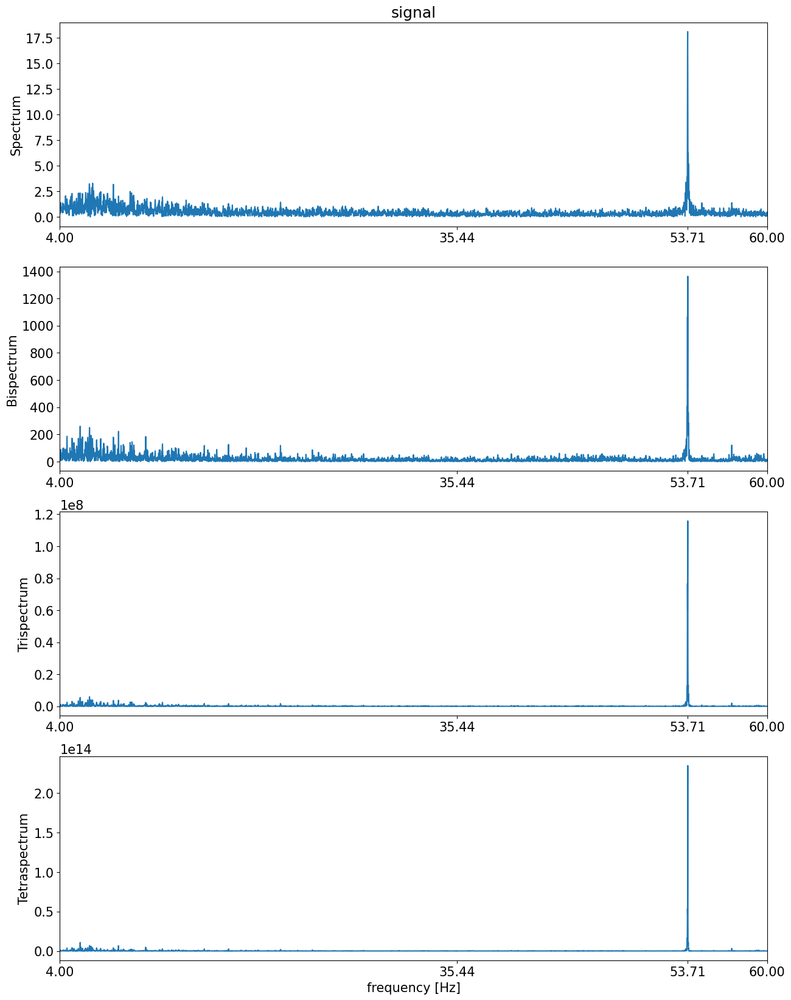

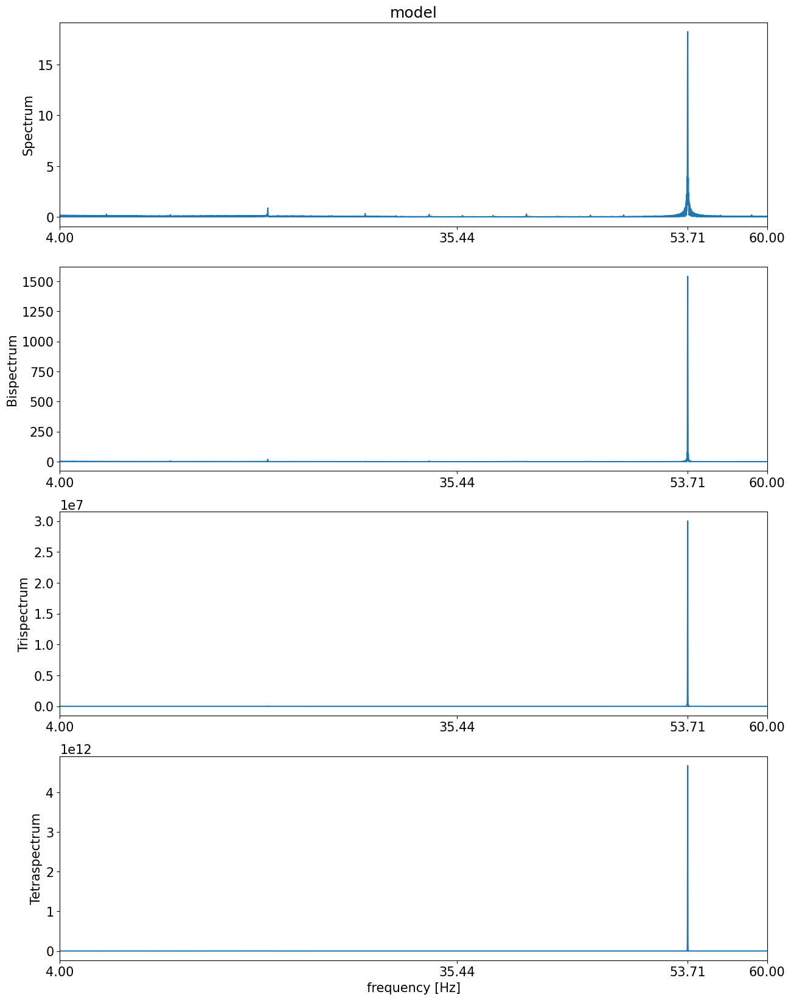

In [73]:

if hosa_df is not None:
    lim = (4, 60)
    ymin = float("Inf")
    ymax = float("-Inf")
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

    tdqs_data = {
        "signal": df_amps_signal,
        "model": df_amps_model
    }

    for name_data, data in tdqs_data.items():
        fig = plt.figure(figsize=(15,20))

        plt.subplot(411)
        plt.title(name_data)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tds_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Spectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(412)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdbs_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Bispectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(413)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdts_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Trispectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(414)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdqs_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Tetraspectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)

        plt.xlabel("frequency [Hz]", fontsize=15)

        plt.xlim([lim[0], lim[1]])

        plt.savefig(
            f"hosa_{id_file}_{id_results}_{name_data}.png",
            format="png",
            bbox_inches='tight', 
            dpi=300
        )

        plt.show()


In [70]:
if hosa_df is not None:
    lim = (4, 60)

    name_data, data = ("signal", df_amps_signal)


    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = df_amps_signal.tds_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = df_amps_signal.tdbs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = df_amps_signal.tdqs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = df_amps_signal.tdts_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    df_plot = pd.DataFrame(
        {
            "frequency": freq,
            "spectrum": y1,
            "bispectrum": y2,
            "trispectrum": y3,
            "quadrispectrum": y4
        }
    )

    fig = px.line(df_plot, x="frequency", y="spectrum", title=f'Spectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="bispectrum", title=f'Bispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="trispectrum", title=f'Trispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="quadrispectrum", title=f'Quadrispectrum {name_data}')
    fig.show()


In [71]:
if hosa_df is not None:
    lim = (4, 60)

    name_data, data = ("model", df_amps_model)


    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = df_amps_signal.tds_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = df_amps_signal.tdbs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = df_amps_signal.tdqs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = df_amps_signal.tdts_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    df_plot = pd.DataFrame(
        {
            "frequency": freq,
            "spectrum": y1,
            "bispectrum": y2,
            "trispectrum": y3,
            "quadrispectrum": y4
        }
    )

    fig = px.line(df_plot, x="frequency", y="spectrum", title=f'Spectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="bispectrum", title=f'Bispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="trispectrum", title=f'Trispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="quadrispectrum", title=f'Quadrispectrum {name_data}')
    fig.show()


In [72]:
erro

NameError: name 'erro' is not defined

# Selecting Data to model - EVENT 2

In [ ]:
event_number = 2
id_results: str = f"event_{event_number}"

event_data = select_event_window(
    df=data_backup, 
    event_name=f"event_{event_number}", 
    samples_before=0, 
    samples_after=0
)

In [ ]:
u = np.vstack([event_data.loc[:, dict_inputs[input_model]] for input_model in inputs]) if len(inputs) > 1 else event_data.loc[:, dict_inputs[inputs[0]]]

In [ ]:
path_files = f"err_model_{id_file}_{id_results}_err.pkl"
err_already_calculated: bool = os.path.isfile(path_files)

if err_already_calculated and not replace_err:
    logger.info("ERR already calculated. Loading...")
    err_out, termos, psi = load_err()
    logger.success("ERR loaded!")
else:
    logger.info("ERR not calculated yet. Generating ERR...")

In [ ]:
y = event_data.Inferior_colliculus_2.to_numpy()

### Obtendo o resultado do Critério de Redução de Erro 

In [ ]:
if not err_already_calculated or replace_err:

    err_obj = err(
        ny=max_y_delays,
        nu=max_u_delays,
        n_lin=degree_of_non_linearity,
        yid=y,
        uid=u,
        cte=True,
    )

    start_time = perf_counter()

    err_out, termos, psi = err_obj.run(print_result=True)

    end_time = perf_counter()

    save_err(err_out, termos, psi)

### Obtendo o Critério de Informação de Akaike para a matriz $\Psi$ gerada pelo ERR

In [ ]:
Phi = np.array([])

aic = np.array([])
parameters = np.array([])

for i in range(len(psi.T)):
    
    if i == 0:
        Phi = psi[:,err_out["ordem"][i]][None]
    else:
        Phi = np.vstack([Phi, psi[:,err_out["ordem"][i]]])  
            
    thetaMQ, residuos = MQ(Phi.T, y[max_delays:])
    
    var_xi = np.var(residuos)
    
    n_theta = len(thetaMQ)
    
    aic = np.append(aic, AIC(n_theta, len(y), var_xi))
    
    parameters = np.append(parameters, i+1)
    
max_number_of_parameters = 100  # float("Inf")
plt.plot(parameters[parameters<=max_number_of_parameters], aic[parameters<=max_number_of_parameters])
plt.title("Critério de Informação de Akaike")
xlabel = "# parâmetros"
caption = f"Simulação livre para validação do modelo não-linear estimado "
plt.xlabel(xlabel+"\n"+caption)
plt.ylabel("AIC($n_{\\theta}$)")
plt.xticks(parameters[parameters<=max_number_of_parameters], rotation=90, ha='right', fontsize=7)
plt.grid()
plt.show()

Considerando o Critério de Informação de Akaike, são escolhidos os 5 primeiros regressores listados, que consistem das combinações de número 1, 14, 7, 2 e 5, da tabela de termos mostrada abaixo:

In [ ]:
number_of_selected_terms = 30

In [ ]:
psi_mq = np.vstack([psi[:,i] for i in err_out["ordem"][:number_of_selected_terms]]).T

theta, xi = MQ(psi_mq, y[max_delays:])

print(f"Theta ordenado: {theta}")

Assim, o modelo NARX escolhido é:

In [ ]:
terms_dict = termos.iloc[err_out["ordem"][:number_of_selected_terms]].T.to_dict()

model = []
model_dict = {}
model_str = []

for reg_number, line in terms_dict.items():
    term = ""
    for reg, power in line.items():
        term += " * " if term and power else ""
        term += reg if power > 0 else ""
        term += f"**{int(power)}" if power > 1 else ""
    term += "1"*(not bool(term))
    term = term.replace("(", "[").replace(")", "]")
    model.append(term)
    model_dict[reg_number] = term
    
print("\n\nOrderedTermos:\n")

for i, term in enumerate(model_dict.values()):
    print(f"{str(i).zfill(2)}: err: {'{:e}'.format((err_out['valor'][:number_of_selected_terms])[i])} - {term}")
    

print("\n\nTermos:\n")

for line, term in model_dict.items():
    print(f"{line}: {term}")
    
terms_per_line = 4
print("\ny(k) = ", end="")
for i, term in enumerate(model, start=1):
    print(f"{term}{' + '*(i not in (len(model),))}", end="\n" if not i % terms_per_line else "")
    
print("\n\n\n")

## Validação utilizando a segunda metade da massa de dados:

In [ ]:
y_free = eval_model_SISO_NARX(
    model=model, 
    theta=theta, 
    u=u.to_numpy(), 
    y=y, 
    y0=y[:max_delays]
)

Carregando a saída da validação e os resíduos de estimação do modelo cuja estrutura foi obtida no Livro-texto, na Lista de Exercícios 9 

## Plotando as curvas de validação

In [ ]:
y_validacao = y_free
time_to_plot = event_data.Time.to_numpy()

plt.figure()
plt.plot(time_to_plot, y, linewidth=2, label="Medição", color='black')
plt.plot(time_to_plot, y_validacao ,marker='.',color = 'red', linewidth=1, label="Simulação Livre")
plt.legend()
plt.ylabel("IC")
caption = f"Simulação livre para validação do modelo não-linear ARX estimado "
plt.xlabel(xlabel+"\n"+caption)

plt.show()

In [ ]:
fig = make_subplots(rows=2, cols=1, subplot_titles=('Signal',  'Event'))

fig.update_layout(
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="black",
    legend_title_font_color="green",
    title="Model Free Simulation Validation",
)

fig.add_trace(go.Scatter(x=time_to_plot, y=y, name="signal"), row=1, col=1)
fig.add_trace(go.Scatter(x=time_to_plot, y=y_validacao, name="model"), row=2, col=1)

fig.show()

Ambos os modelos apresentaram curvas estáticas similares e não serão apresentadas neste trabalho por já constarem nas listas de Exercícios anteriores.

#### Cálculo do RMSD

In [ ]:
rmsd = RMSD(y, y_validacao)

print(f"RMSD Modelo Estimado ({len(theta)} parâmetros): {np.round(rmsd, 5)}")

In [ ]:
y = y_signal = event_data.Inferior_colliculus_2.to_numpy()

lim = (4, 60)
ymin = float("Inf")
ymax = float("-Inf")
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

colors = ["black", "orange", "red", "green", "blue"]

fft_data = {
    "signal": y,
    "model": y_validacao
}

for name_data, data in fft_data.items():
    fig = plt.figure(figsize=(14,10))

    ax = fig.add_subplot(111)

    frequency, intensity, angle = fft(x=data, fs=FrequencySampling)
    y = (intensity)[(frequency>=lim[0])&(frequency<=lim[1])]
    x = (frequency)[(frequency>=lim[0])&(frequency<=lim[1])]
    
    ax.plot(x, y, label=f"{name_data}")
    
    ax.set_xlabel("frequency [Hz]", fontsize=30)
    ax.set_ylabel('Intensity', fontsize=30)
    t = ax.yaxis.get_offset_text()
    t.set_size(20)
    
    plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 4), [53.71])), fontsize=15)
    plt.xlim([lim[0], lim[1]])
    plt.legend(prop={'size': 20})
    plt.savefig(
        f"FFT_{id_file}_{name_data}.jpg",
        format="jpg",
        bbox_inches='tight', 
        dpi=150
    )

    plt.show()


In [ ]:

fig = plt.figure(figsize=(14,10))

ax = fig.add_subplot(111)

frequency, intensity, angle = fft(x=u, fs=FrequencySampling)
y = (intensity)[(frequency>=lim[0])&(frequency<=lim[1])]
x = (frequency)[(frequency>=lim[0])&(frequency<=lim[1])]

ax.plot(x, y, label=f"{name_data}")

ax.set_xlabel("frequency [Hz]", fontsize=30)
ax.set_ylabel('Intensity', fontsize=30)
t = ax.yaxis.get_offset_text()
t.set_size(20)

plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 4), [53.71])), fontsize=15)
plt.xlim([lim[0], lim[1]])
plt.legend(prop={'size': 20})
plt.savefig(
    f"FFT_{id_file}_{name_data}.jpg",
    format="jpg",
    bbox_inches='tight', 
    dpi=150
)

plt.show()

In [ ]:
path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
load_already_calculated: bool = os.path.isfile(path_files)

hosa_df = None

if load_already_calculated and not replace_hosa:
    logger.info("HOSA already calculated. Loading...")
    hosa_df = pd.read_csv(path_files)
    logger.success("HOSA loaded!")

else:
    logger.info("HOSA not calculated yet. Generating hosa...")

In [ ]:
if (not load_already_calculated or replace_hosa) and generate_hosa:

    frequency_array = np.arange(start=4, stop=60, step=0.01)

    TDQS_PARAMETERS = {
        "frequency_array": frequency_array,
        "phase_step": 0.01
    }

    df_amps = pd.DataFrame()
    df_phases = pd.DataFrame()
    
    df_amps_model = pd.DataFrame()
    df_phases_model = pd.DataFrame()

    df_amps_signal = pd.DataFrame()
    df_phases_signal = pd.DataFrame()

    logger.info("Processing the tdqs... This may take a while...\n")
    start_time = perf_counter()

    # Process the tdts for each channel, in parallel

    tdqs_object = TDQS(
        frequency_sampling=FrequencySampling,
        frequency_array=TDQS_PARAMETERS.get("frequency_array"),
        fmin=None,
        fmax=None,
        freq_step=None,
        phase_step=TDQS_PARAMETERS["phase_step"]
    )

    f = lambda x: tdqs_object.run_td4spectrum(x)

    with Pool() as pool:

        for result in pool.map(
            f, 
            [
                {
                    signal_name: signal_array
                } for signal_name, signal_array in {"signal": y_signal, "model": y_validacao}.items()
            ]
        ):

            signal_name, result_data = list(result.items())[0]
            (
                frequency_array, 
                spectrum, 
                phase_spectrum, 
                bispectrum, 
                phase_bispectrum, 
                trispectrum, 
                phase_trispectrum,
                tetraspectrum,
                phase_tetraspectrum         
            ) = result_data

            if "frequency" not in df_amps.columns:
                df_amps = df_amps.assign(frequency=frequency_array)
            if "frequency" not in df_amps_signal.columns:
                df_amps_signal = df_amps_signal.assign(frequency=frequency_array)
            if "frequency" not in df_amps_model.columns:
                df_amps_model = df_amps_model.assign(frequency=frequency_array)

            df_amps = df_amps.assign(**{f"tds_amp_{signal_name}": spectrum})
            df_phases = df_phases.assign(**{f"tds_phase_{signal_name}": phase_spectrum})

            df_amps = df_amps.assign(**{f"tdbs_amp_{signal_name}": bispectrum})
            df_phases = df_phases.assign(**{f"tdbs_phase_{signal_name}": phase_bispectrum})

            df_amps = df_amps.assign(**{f"tdts_amp_{signal_name}": trispectrum})
            df_phases = df_phases.assign(**{f"tdts_phase_{signal_name}": phase_trispectrum})

            df_amps = df_amps.assign(**{f"tdqs_amp_{signal_name}": tetraspectrum})
            df_phases = df_phases.assign(**{f"tdqs_phase_{signal_name}": phase_tetraspectrum})
            
            if signal_name == "signal":
                df_amps_signal = df_amps_signal.assign(**{f"tds_amp": spectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdbs_amp": bispectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdts_amp": trispectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdqs_amp": tetraspectrum})
                
                df_phases_signal = df_phases_signal.assign(**{f"tds_phase": phase_spectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdbs_phase": phase_bispectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdts_phase": phase_trispectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdqs_phase": phase_tetraspectrum})
                
            elif signal_name == "model":
                df_amps_model = df_amps_model.assign(**{f"tds_amp": spectrum})
                df_amps_model = df_amps_model.assign(**{f"tdbs_amp": bispectrum})
                df_amps_model = df_amps_model.assign(**{f"tdts_amp": trispectrum})
                df_amps_model = df_amps_model.assign(**{f"tdqs_amp": tetraspectrum})
                
                df_phases_model = df_phases_model.assign(**{f"tds_phase": phase_spectrum})
                df_phases_model = df_phases_model.assign(**{f"tdbs_phase": phase_bispectrum})
                df_phases_model = df_phases_model.assign(**{f"tdts_phase": phase_trispectrum})
                df_phases_model = df_phases_model.assign(**{f"tdqs_phase": phase_tetraspectrum})



    hosa_df = pd.concat([df_amps, df_phases], axis=1)

    
    
    
    hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

    end_time = perf_counter()

    logger.success(f"Done processing data. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")
    
elif hosa_df is not None:
    
    df_amps_model = pd.DataFrame()
    df_phases_model = pd.DataFrame()

    df_amps_signal = pd.DataFrame()
    df_phases_signal = pd.DataFrame()
    
    df_amps_signal = df_amps_signal.assign(frequency=hosa_df.frequency)
    df_amps_signal = df_amps_signal.assign(**{f"tds_amp": hosa_df.tds_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdbs_amp": hosa_df.tdbs_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdts_amp": hosa_df.tdts_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdqs_amp": hosa_df.tdqs_amp_signal})
    
    df_amps_model = df_amps_model.assign(frequency=hosa_df.frequency)
    df_amps_model = df_amps_model.assign(**{f"tds_amp": hosa_df.tds_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdbs_amp": hosa_df.tdbs_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdts_amp": hosa_df.tdts_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdqs_amp": hosa_df.tdqs_amp_model})

In [ ]:
frequency = df_amps_model.frequency.to_numpy()

In [ ]:

if hosa_df is not None:
    lim = (4, 60)
    ymin = float("Inf")
    ymax = float("-Inf")
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

    tdqs_data = {
        "signal": df_amps_signal,
        "model": df_amps_model
    }

    for name_data, data in tdqs_data.items():
        fig = plt.figure(figsize=(15,20))

        plt.subplot(411)
        plt.title(name_data)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tds_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Spectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(412)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdbs_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Bispectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(413)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdts_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Trispectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(414)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdqs_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Tetraspectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)

        plt.xlabel("frequency [Hz]", fontsize=15)

        plt.xlim([lim[0], lim[1]])

        plt.savefig(
            f"hosa_{id_file}_{id_results}.jpg",
            format="jpg",
            bbox_inches='tight', 
            dpi=150
        )

        plt.show()


In [ ]:
if hosa_df is not None:
    lim = (4, 60)

    name_data, data = ("signal", df_amps_signal)


    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = df_amps_signal.tds_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = df_amps_signal.tdbs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = df_amps_signal.tdqs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = df_amps_signal.tdts_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    df_plot = pd.DataFrame(
        {
            "frequency": freq,
            "spectrum": y1,
            "bispectrum": y2,
            "trispectrum": y3,
            "quadrispectrum": y4
        }
    )

    fig = px.line(df_plot, x="frequency", y="spectrum", title=f'Spectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="bispectrum", title=f'Bispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="trispectrum", title=f'Trispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="quadrispectrum", title=f'Quadrispectrum {name_data}')
    fig.show()


In [ ]:
if hosa_df is not None:
    lim = (4, 60)

    name_data, data = ("model", df_amps_model)


    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = df_amps_signal.tds_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = df_amps_signal.tdbs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = df_amps_signal.tdqs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = df_amps_signal.tdts_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    df_plot = pd.DataFrame(
        {
            "frequency": freq,
            "spectrum": y1,
            "bispectrum": y2,
            "trispectrum": y3,
            "quadrispectrum": y4
        }
    )

    fig = px.line(df_plot, x="frequency", y="spectrum", title=f'Spectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="bispectrum", title=f'Bispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="trispectrum", title=f'Trispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="quadrispectrum", title=f'Quadrispectrum {name_data}')
    fig.show()


# Selecting Data to model - EVENT 3

In [ ]:
event_number = 3
id_results: str = f"event_{event_number}"

event_data = select_event_window(
    df=data_backup, 
    event_name=f"event_{event_number}", 
    samples_before=0, 
    samples_after=0
)

In [ ]:
u = np.vstack([event_data.loc[:, dict_inputs[input_model]] for input_model in inputs]) if len(inputs) > 1 else event_data.loc[:, dict_inputs[inputs[0]]]

In [ ]:
path_files = f"err_model_{id_file}_{id_results}_err.pkl"
err_already_calculated: bool = os.path.isfile(path_files)

if err_already_calculated and not replace_err:
    logger.info("ERR already calculated. Loading...")
    err_out, termos, psi = load_err()
    logger.success("ERR loaded!")
else:
    logger.info("ERR not calculated yet. Generating ERR...")

In [ ]:
y = event_data.Inferior_colliculus_2.to_numpy()

### Obtendo o resultado do Critério de Redução de Erro 

In [ ]:
if not err_already_calculated or replace_err:

    err_obj = err(
        ny=max_y_delays,
        nu=max_u_delays,
        n_lin=degree_of_non_linearity,
        yid=y,
        uid=u,
        cte=True,
    )

    start_time = perf_counter()

    err_out, termos, psi = err_obj.run(print_result=True)

    end_time = perf_counter()

    save_err(err_out, termos, psi)

### Obtendo o Critério de Informação de Akaike para a matriz $\Psi$ gerada pelo ERR

In [ ]:
Phi = np.array([])

aic = np.array([])
parameters = np.array([])

for i in range(len(psi.T)):
    
    if i == 0:
        Phi = psi[:,err_out["ordem"][i]][None]
    else:
        Phi = np.vstack([Phi, psi[:,err_out["ordem"][i]]])  
            
    thetaMQ, residuos = MQ(Phi.T, y[max_delays:])
    
    var_xi = np.var(residuos)
    
    n_theta = len(thetaMQ)
    
    aic = np.append(aic, AIC(n_theta, len(y), var_xi))
    
    parameters = np.append(parameters, i+1)
    
max_number_of_parameters = 100  # float("Inf")
plt.plot(parameters[parameters<=max_number_of_parameters], aic[parameters<=max_number_of_parameters])
plt.title("Critério de Informação de Akaike")
xlabel = "# parâmetros"
caption = f"Simulação livre para validação do modelo não-linear estimado "
plt.xlabel(xlabel+"\n"+caption)
plt.ylabel("AIC($n_{\\theta}$)")
plt.xticks(parameters[parameters<=max_number_of_parameters], rotation=90, ha='right', fontsize=7)
plt.grid()
plt.show()

Considerando o Critério de Informação de Akaike, são escolhidos os 5 primeiros regressores listados, que consistem das combinações de número 1, 14, 7, 2 e 5, da tabela de termos mostrada abaixo:

In [ ]:
number_of_selected_terms = 38

In [ ]:
psi_mq = np.vstack([psi[:,i] for i in err_out["ordem"][:number_of_selected_terms]]).T

theta, xi = MQ(psi_mq, y[max_delays:])

print(f"Theta ordenado: {theta}")

Assim, o modelo NARX escolhido é:

In [ ]:
terms_dict = termos.iloc[err_out["ordem"][:number_of_selected_terms]].T.to_dict()

model = []
model_dict = {}
model_str = []

for reg_number, line in terms_dict.items():
    term = ""
    for reg, power in line.items():
        term += " * " if term and power else ""
        term += reg if power > 0 else ""
        term += f"**{int(power)}" if power > 1 else ""
    term += "1"*(not bool(term))
    term = term.replace("(", "[").replace(")", "]")
    model.append(term)
    model_dict[reg_number] = term
    
print("\n\nOrderedTermos:\n")

for i, term in enumerate(model_dict.values()):
    print(f"{str(i).zfill(2)}: err: {'{:e}'.format((err_out['valor'][:number_of_selected_terms])[i])} - {term}")
    

print("\n\nTermos:\n")

for line, term in model_dict.items():
    print(f"{line}: {term}")
    
terms_per_line = 4
print("\ny(k) = ", end="")
for i, term in enumerate(model, start=1):
    print(f"{term}{' + '*(i not in (len(model),))}", end="\n" if not i % terms_per_line else "")
    
print("\n\n\n")

## Validação utilizando a segunda metade da massa de dados:

In [ ]:
y_free = eval_model_SISO_NARX(
    model=model, 
    theta=theta, 
    u=u.to_numpy(), 
    y=y, 
    y0=y[:max_delays]
)

Carregando a saída da validação e os resíduos de estimação do modelo cuja estrutura foi obtida no Livro-texto, na Lista de Exercícios 9 

## Plotando as curvas de validação

In [ ]:
y_validacao = y_free
time_to_plot = event_data.Time.to_numpy()

plt.figure()
plt.plot(time_to_plot, y, linewidth=2, label="Medição", color='black')
plt.plot(time_to_plot, y_validacao ,marker='.',color = 'red', linewidth=1, label="Simulação Livre")
plt.legend()
plt.ylabel("IC")
caption = f"Simulação livre para validação do modelo não-linear ARX estimado "
plt.xlabel(xlabel+"\n"+caption)

plt.show()

In [ ]:
fig = make_subplots(rows=2, cols=1, subplot_titles=('Signal',  'Event'))

fig.update_layout(
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="black",
    legend_title_font_color="green",
    title="Model Free Simulation Validation",
)

fig.add_trace(go.Scatter(x=time_to_plot, y=y, name="signal"), row=1, col=1)
fig.add_trace(go.Scatter(x=time_to_plot, y=y_validacao, name="model"), row=2, col=1)

fig.show()

Ambos os modelos apresentaram curvas estáticas similares e não serão apresentadas neste trabalho por já constarem nas listas de Exercícios anteriores.

#### Cálculo do RMSD

In [ ]:
rmsd = RMSD(y, y_validacao)

print(f"RMSD Modelo Estimado ({len(theta)} parâmetros): {np.round(rmsd, 5)}")

In [ ]:
y = y_signal = event_data.Inferior_colliculus_2.to_numpy()

lim = (4, 60)
ymin = float("Inf")
ymax = float("-Inf")
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

colors = ["black", "orange", "red", "green", "blue"]

fft_data = {
    "signal": y,
    "model": y_validacao
}

for name_data, data in fft_data.items():
    fig = plt.figure(figsize=(14,10))

    ax = fig.add_subplot(111)

    frequency, intensity, angle = fft(x=data, fs=FrequencySampling)
    y = (intensity)[(frequency>=lim[0])&(frequency<=lim[1])]
    x = (frequency)[(frequency>=lim[0])&(frequency<=lim[1])]
    
    ax.plot(x, y, label=f"{name_data}")
    
    ax.set_xlabel("frequency [Hz]", fontsize=30)
    ax.set_ylabel('Intensity', fontsize=30)
    t = ax.yaxis.get_offset_text()
    t.set_size(20)
    
    plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 4), [53.71])), fontsize=15)
    plt.xlim([lim[0], lim[1]])
    plt.legend(prop={'size': 20})
    plt.savefig(
        f"FFT_{id_file}_{name_data}.jpg",
        format="jpg",
        bbox_inches='tight', 
        dpi=150
    )

    plt.show()


In [ ]:

fig = plt.figure(figsize=(14,10))

ax = fig.add_subplot(111)

frequency, intensity, angle = fft(x=u, fs=FrequencySampling)
y = (intensity)[(frequency>=lim[0])&(frequency<=lim[1])]
x = (frequency)[(frequency>=lim[0])&(frequency<=lim[1])]

ax.plot(x, y, label=f"{name_data}")

ax.set_xlabel("frequency [Hz]", fontsize=30)
ax.set_ylabel('Intensity', fontsize=30)
t = ax.yaxis.get_offset_text()
t.set_size(20)

plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 4), [53.71])), fontsize=15)
plt.xlim([lim[0], lim[1]])
plt.legend(prop={'size': 20})
plt.savefig(
    f"FFT_{id_file}_{name_data}.jpg",
    format="jpg",
    bbox_inches='tight', 
    dpi=150
)

plt.show()

In [ ]:
path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
load_already_calculated: bool = os.path.isfile(path_files)

hosa_df = None

if load_already_calculated and not replace_hosa:
    logger.info("HOSA already calculated. Loading...")
    hosa_df = pd.read_csv(path_files)
    logger.success("HOSA loaded!")

else:
    logger.info("HOSA not calculated yet. Generating hosa...")

In [ ]:
if (not load_already_calculated or replace_hosa) and generate_hosa:

    frequency_array = np.arange(start=4, stop=60, step=0.01)

    TDQS_PARAMETERS = {
        "frequency_array": frequency_array,
        "phase_step": 0.01
    }

    df_amps = pd.DataFrame()
    df_phases = pd.DataFrame()
    
    df_amps_model = pd.DataFrame()
    df_phases_model = pd.DataFrame()

    df_amps_signal = pd.DataFrame()
    df_phases_signal = pd.DataFrame()

    logger.info("Processing the tdqs... This may take a while...\n")
    start_time = perf_counter()

    # Process the tdts for each channel, in parallel

    tdqs_object = TDQS(
        frequency_sampling=FrequencySampling,
        frequency_array=TDQS_PARAMETERS.get("frequency_array"),
        fmin=None,
        fmax=None,
        freq_step=None,
        phase_step=TDQS_PARAMETERS["phase_step"]
    )

    f = lambda x: tdqs_object.run_td4spectrum(x)

    with Pool() as pool:

        for result in pool.map(
            f, 
            [
                {
                    signal_name: signal_array
                } for signal_name, signal_array in {"signal": y_signal, "model": y_validacao}.items()
            ]
        ):

            signal_name, result_data = list(result.items())[0]
            (
                frequency_array, 
                spectrum, 
                phase_spectrum, 
                bispectrum, 
                phase_bispectrum, 
                trispectrum, 
                phase_trispectrum,
                tetraspectrum,
                phase_tetraspectrum         
            ) = result_data

            if "frequency" not in df_amps.columns:
                df_amps = df_amps.assign(frequency=frequency_array)
            if "frequency" not in df_amps_signal.columns:
                df_amps_signal = df_amps_signal.assign(frequency=frequency_array)
            if "frequency" not in df_amps_model.columns:
                df_amps_model = df_amps_model.assign(frequency=frequency_array)

            df_amps = df_amps.assign(**{f"tds_amp_{signal_name}": spectrum})
            df_phases = df_phases.assign(**{f"tds_phase_{signal_name}": phase_spectrum})

            df_amps = df_amps.assign(**{f"tdbs_amp_{signal_name}": bispectrum})
            df_phases = df_phases.assign(**{f"tdbs_phase_{signal_name}": phase_bispectrum})

            df_amps = df_amps.assign(**{f"tdts_amp_{signal_name}": trispectrum})
            df_phases = df_phases.assign(**{f"tdts_phase_{signal_name}": phase_trispectrum})

            df_amps = df_amps.assign(**{f"tdqs_amp_{signal_name}": tetraspectrum})
            df_phases = df_phases.assign(**{f"tdqs_phase_{signal_name}": phase_tetraspectrum})
            
            if signal_name == "signal":
                df_amps_signal = df_amps_signal.assign(**{f"tds_amp": spectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdbs_amp": bispectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdts_amp": trispectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdqs_amp": tetraspectrum})
                
                df_phases_signal = df_phases_signal.assign(**{f"tds_phase": phase_spectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdbs_phase": phase_bispectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdts_phase": phase_trispectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdqs_phase": phase_tetraspectrum})
                
            elif signal_name == "model":
                df_amps_model = df_amps_model.assign(**{f"tds_amp": spectrum})
                df_amps_model = df_amps_model.assign(**{f"tdbs_amp": bispectrum})
                df_amps_model = df_amps_model.assign(**{f"tdts_amp": trispectrum})
                df_amps_model = df_amps_model.assign(**{f"tdqs_amp": tetraspectrum})
                
                df_phases_model = df_phases_model.assign(**{f"tds_phase": phase_spectrum})
                df_phases_model = df_phases_model.assign(**{f"tdbs_phase": phase_bispectrum})
                df_phases_model = df_phases_model.assign(**{f"tdts_phase": phase_trispectrum})
                df_phases_model = df_phases_model.assign(**{f"tdqs_phase": phase_tetraspectrum})



    hosa_df = pd.concat([df_amps, df_phases], axis=1)

    
    
    
    hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

    end_time = perf_counter()

    logger.success(f"Done processing data. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")
    
elif hosa_df is not None:
    
    df_amps_model = pd.DataFrame()
    df_phases_model = pd.DataFrame()

    df_amps_signal = pd.DataFrame()
    df_phases_signal = pd.DataFrame()
    
    df_amps_signal = df_amps_signal.assign(frequency=hosa_df.frequency)
    df_amps_signal = df_amps_signal.assign(**{f"tds_amp": hosa_df.tds_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdbs_amp": hosa_df.tdbs_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdts_amp": hosa_df.tdts_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdqs_amp": hosa_df.tdqs_amp_signal})
    
    df_amps_model = df_amps_model.assign(frequency=hosa_df.frequency)
    df_amps_model = df_amps_model.assign(**{f"tds_amp": hosa_df.tds_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdbs_amp": hosa_df.tdbs_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdts_amp": hosa_df.tdts_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdqs_amp": hosa_df.tdqs_amp_model})

In [ ]:
frequency = df_amps_model.frequency.to_numpy()

In [ ]:

if hosa_df is not None:
    lim = (4, 60)
    ymin = float("Inf")
    ymax = float("-Inf")
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

    tdqs_data = {
        "signal": df_amps_signal,
        "model": df_amps_model
    }

    for name_data, data in tdqs_data.items():
        fig = plt.figure(figsize=(15,20))

        plt.subplot(411)
        plt.title(name_data)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tds_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Spectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(412)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdbs_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Bispectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(413)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdts_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Trispectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(414)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdqs_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Tetraspectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)

        plt.xlabel("frequency [Hz]", fontsize=15)

        plt.xlim([lim[0], lim[1]])

        plt.savefig(
            f"hosa_{id_file}_{id_results}.jpg",
            format="jpg",
            bbox_inches='tight', 
            dpi=150
        )

        plt.show()


In [ ]:
if hosa_df is not None:
    lim = (4, 60)

    name_data, data = ("signal", df_amps_signal)


    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = df_amps_signal.tds_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = df_amps_signal.tdbs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = df_amps_signal.tdqs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = df_amps_signal.tdts_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    df_plot = pd.DataFrame(
        {
            "frequency": freq,
            "spectrum": y1,
            "bispectrum": y2,
            "trispectrum": y3,
            "quadrispectrum": y4
        }
    )

    fig = px.line(df_plot, x="frequency", y="spectrum", title=f'Spectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="bispectrum", title=f'Bispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="trispectrum", title=f'Trispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="quadrispectrum", title=f'Quadrispectrum {name_data}')
    fig.show()


In [ ]:
if hosa_df is not None:
    lim = (4, 60)

    name_data, data = ("model", df_amps_model)


    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = df_amps_signal.tds_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = df_amps_signal.tdbs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = df_amps_signal.tdqs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = df_amps_signal.tdts_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    df_plot = pd.DataFrame(
        {
            "frequency": freq,
            "spectrum": y1,
            "bispectrum": y2,
            "trispectrum": y3,
            "quadrispectrum": y4
        }
    )

    fig = px.line(df_plot, x="frequency", y="spectrum", title=f'Spectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="bispectrum", title=f'Bispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="trispectrum", title=f'Trispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="quadrispectrum", title=f'Quadrispectrum {name_data}')
    fig.show()


# Selecting Data to model - EVENT 4

In [ ]:
event_number = 4
id_results: str = f"event_{event_number}"

event_data = select_event_window(
    df=data_backup, 
    event_name=f"event_{event_number}", 
    samples_before=0, 
    samples_after=0
)

In [ ]:
u = np.vstack([event_data.loc[:, dict_inputs[input_model]] for input_model in inputs]) if len(inputs) > 1 else event_data.loc[:, dict_inputs[inputs[0]]]

In [ ]:
path_files = f"err_model_{id_file}_{id_results}_err.pkl"
err_already_calculated: bool = os.path.isfile(path_files)

if err_already_calculated and not replace_err:
    logger.info("ERR already calculated. Loading...")
    err_out, termos, psi = load_err()
    logger.success("ERR loaded!")
else:
    logger.info("ERR not calculated yet. Generating ERR...")

In [ ]:
y = event_data.Inferior_colliculus_2.to_numpy()

### Obtendo o resultado do Critério de Redução de Erro 

In [ ]:
if not err_already_calculated or replace_err:

    err_obj = err(
        ny=max_y_delays,
        nu=max_u_delays,
        n_lin=degree_of_non_linearity,
        yid=y,
        uid=u,
        cte=True,
    )

    start_time = perf_counter()

    err_out, termos, psi = err_obj.run(print_result=True)

    end_time = perf_counter()

    save_err(err_out, termos, psi)

### Obtendo o Critério de Informação de Akaike para a matriz $\Psi$ gerada pelo ERR

In [ ]:
Phi = np.array([])

aic = np.array([])
parameters = np.array([])

for i in range(len(psi.T)):
    
    if i == 0:
        Phi = psi[:,err_out["ordem"][i]][None]
    else:
        Phi = np.vstack([Phi, psi[:,err_out["ordem"][i]]])  
            
    thetaMQ, residuos = MQ(Phi.T, y[max_delays:])
    
    var_xi = np.var(residuos)
    
    n_theta = len(thetaMQ)
    
    aic = np.append(aic, AIC(n_theta, len(y), var_xi))
    
    parameters = np.append(parameters, i+1)
    
max_number_of_parameters = 100  # float("Inf")
plt.plot(parameters[parameters<=max_number_of_parameters], aic[parameters<=max_number_of_parameters])
plt.title("Critério de Informação de Akaike")
xlabel = "# parâmetros"
caption = f"Simulação livre para validação do modelo não-linear estimado "
plt.xlabel(xlabel+"\n"+caption)
plt.ylabel("AIC($n_{\\theta}$)")
plt.xticks(parameters[parameters<=max_number_of_parameters], rotation=90, ha='right', fontsize=7)
plt.grid()
plt.show()

Considerando o Critério de Informação de Akaike, são escolhidos os 5 primeiros regressores listados, que consistem das combinações de número 1, 14, 7, 2 e 5, da tabela de termos mostrada abaixo:

In [ ]:
number_of_selected_terms = 33

In [ ]:
psi_mq = np.vstack([psi[:,i] for i in err_out["ordem"][:number_of_selected_terms]]).T

theta, xi = MQ(psi_mq, y[max_delays:])

print(f"Theta ordenado: {theta}")

Assim, o modelo NARX escolhido é:

In [ ]:
terms_dict = termos.iloc[err_out["ordem"][:number_of_selected_terms]].T.to_dict()

model = []
model_dict = {}
model_str = []

for reg_number, line in terms_dict.items():
    term = ""
    for reg, power in line.items():
        term += " * " if term and power else ""
        term += reg if power > 0 else ""
        term += f"**{int(power)}" if power > 1 else ""
    term += "1"*(not bool(term))
    term = term.replace("(", "[").replace(")", "]")
    model.append(term)
    model_dict[reg_number] = term
    
print("\n\nOrderedTermos:\n")

for i, term in enumerate(model_dict.values()):
    print(f"{str(i).zfill(2)}: err: {'{:e}'.format((err_out['valor'][:number_of_selected_terms])[i])} - {term}")
    

print("\n\nTermos:\n")

for line, term in model_dict.items():
    print(f"{line}: {term}")
    
terms_per_line = 4
print("\ny(k) = ", end="")
for i, term in enumerate(model, start=1):
    print(f"{term}{' + '*(i not in (len(model),))}", end="\n" if not i % terms_per_line else "")
    
print("\n\n\n")

## Validação utilizando a segunda metade da massa de dados:

In [ ]:
y_free = eval_model_SISO_NARX(
    model=model, 
    theta=theta, 
    u=u.to_numpy(), 
    y=y, 
    y0=y[:max_delays]
)

Carregando a saída da validação e os resíduos de estimação do modelo cuja estrutura foi obtida no Livro-texto, na Lista de Exercícios 9 

## Plotando as curvas de validação

In [ ]:
y_validacao = y_free
time_to_plot = event_data.Time.to_numpy()

plt.figure()
plt.plot(time_to_plot, y, linewidth=2, label="Medição", color='black')
plt.plot(time_to_plot, y_validacao ,marker='.',color = 'red', linewidth=1, label="Simulação Livre")
plt.legend()
plt.ylabel("IC")
caption = f"Simulação livre para validação do modelo não-linear ARX estimado "
plt.xlabel(xlabel+"\n"+caption)

plt.show()

In [ ]:
fig = make_subplots(rows=2, cols=1, subplot_titles=('Signal',  'Event'))

fig.update_layout(
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="black",
    legend_title_font_color="green",
    title="Model Free Simulation Validation",
)

fig.add_trace(go.Scatter(x=time_to_plot, y=y, name="signal"), row=1, col=1)
fig.add_trace(go.Scatter(x=time_to_plot, y=y_validacao, name="model"), row=2, col=1)

fig.show()

Ambos os modelos apresentaram curvas estáticas similares e não serão apresentadas neste trabalho por já constarem nas listas de Exercícios anteriores.

#### Cálculo do RMSD

In [ ]:
rmsd = RMSD(y, y_validacao)

print(f"RMSD Modelo Estimado ({len(theta)} parâmetros): {np.round(rmsd, 5)}")

In [ ]:
y = y_signal = event_data.Inferior_colliculus_2.to_numpy()

lim = (4, 60)
ymin = float("Inf")
ymax = float("-Inf")
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

colors = ["black", "orange", "red", "green", "blue"]

fft_data = {
    "signal": y,
    "model": y_validacao
}

for name_data, data in fft_data.items():
    fig = plt.figure(figsize=(14,10))

    ax = fig.add_subplot(111)

    frequency, intensity, angle = fft(x=data, fs=FrequencySampling)
    y = (intensity)[(frequency>=lim[0])&(frequency<=lim[1])]
    x = (frequency)[(frequency>=lim[0])&(frequency<=lim[1])]
    
    ax.plot(x, y, label=f"{name_data}")
    
    ax.set_xlabel("frequency [Hz]", fontsize=30)
    ax.set_ylabel('Intensity', fontsize=30)
    t = ax.yaxis.get_offset_text()
    t.set_size(20)
    
    plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 4), [53.71])), fontsize=15)
    plt.xlim([lim[0], lim[1]])
    plt.legend(prop={'size': 20})
    plt.savefig(
        f"FFT_{id_file}_{name_data}.jpg",
        format="jpg",
        bbox_inches='tight', 
        dpi=150
    )

    plt.show()


In [ ]:

fig = plt.figure(figsize=(14,10))

ax = fig.add_subplot(111)

frequency, intensity, angle = fft(x=u, fs=FrequencySampling)
y = (intensity)[(frequency>=lim[0])&(frequency<=lim[1])]
x = (frequency)[(frequency>=lim[0])&(frequency<=lim[1])]

ax.plot(x, y, label=f"{name_data}")

ax.set_xlabel("frequency [Hz]", fontsize=30)
ax.set_ylabel('Intensity', fontsize=30)
t = ax.yaxis.get_offset_text()
t.set_size(20)

plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 4), [53.71])), fontsize=15)
plt.xlim([lim[0], lim[1]])
plt.legend(prop={'size': 20})
plt.savefig(
    f"FFT_{id_file}_{name_data}.jpg",
    format="jpg",
    bbox_inches='tight', 
    dpi=150
)

plt.show()

In [ ]:
path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
load_already_calculated: bool = os.path.isfile(path_files)

hosa_df = None

if load_already_calculated and not replace_hosa:
    logger.info("HOSA already calculated. Loading...")
    hosa_df = pd.read_csv(path_files)
    logger.success("HOSA loaded!")

else:
    logger.info("HOSA not calculated yet. Generating hosa...")

In [ ]:
if (not load_already_calculated or replace_hosa) and generate_hosa:

    frequency_array = np.arange(start=4, stop=60, step=0.01)

    TDQS_PARAMETERS = {
        "frequency_array": frequency_array,
        "phase_step": 0.01
    }

    df_amps = pd.DataFrame()
    df_phases = pd.DataFrame()
    
    df_amps_model = pd.DataFrame()
    df_phases_model = pd.DataFrame()

    df_amps_signal = pd.DataFrame()
    df_phases_signal = pd.DataFrame()

    logger.info("Processing the tdqs... This may take a while...\n")
    start_time = perf_counter()

    # Process the tdts for each channel, in parallel

    tdqs_object = TDQS(
        frequency_sampling=FrequencySampling,
        frequency_array=TDQS_PARAMETERS.get("frequency_array"),
        fmin=None,
        fmax=None,
        freq_step=None,
        phase_step=TDQS_PARAMETERS["phase_step"]
    )

    f = lambda x: tdqs_object.run_td4spectrum(x)

    with Pool() as pool:

        for result in pool.map(
            f, 
            [
                {
                    signal_name: signal_array
                } for signal_name, signal_array in {"signal": y_signal, "model": y_validacao}.items()
            ]
        ):

            signal_name, result_data = list(result.items())[0]
            (
                frequency_array, 
                spectrum, 
                phase_spectrum, 
                bispectrum, 
                phase_bispectrum, 
                trispectrum, 
                phase_trispectrum,
                tetraspectrum,
                phase_tetraspectrum         
            ) = result_data

            if "frequency" not in df_amps.columns:
                df_amps = df_amps.assign(frequency=frequency_array)
            if "frequency" not in df_amps_signal.columns:
                df_amps_signal = df_amps_signal.assign(frequency=frequency_array)
            if "frequency" not in df_amps_model.columns:
                df_amps_model = df_amps_model.assign(frequency=frequency_array)

            df_amps = df_amps.assign(**{f"tds_amp_{signal_name}": spectrum})
            df_phases = df_phases.assign(**{f"tds_phase_{signal_name}": phase_spectrum})

            df_amps = df_amps.assign(**{f"tdbs_amp_{signal_name}": bispectrum})
            df_phases = df_phases.assign(**{f"tdbs_phase_{signal_name}": phase_bispectrum})

            df_amps = df_amps.assign(**{f"tdts_amp_{signal_name}": trispectrum})
            df_phases = df_phases.assign(**{f"tdts_phase_{signal_name}": phase_trispectrum})

            df_amps = df_amps.assign(**{f"tdqs_amp_{signal_name}": tetraspectrum})
            df_phases = df_phases.assign(**{f"tdqs_phase_{signal_name}": phase_tetraspectrum})
            
            if signal_name == "signal":
                df_amps_signal = df_amps_signal.assign(**{f"tds_amp": spectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdbs_amp": bispectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdts_amp": trispectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdqs_amp": tetraspectrum})
                
                df_phases_signal = df_phases_signal.assign(**{f"tds_phase": phase_spectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdbs_phase": phase_bispectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdts_phase": phase_trispectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdqs_phase": phase_tetraspectrum})
                
            elif signal_name == "model":
                df_amps_model = df_amps_model.assign(**{f"tds_amp": spectrum})
                df_amps_model = df_amps_model.assign(**{f"tdbs_amp": bispectrum})
                df_amps_model = df_amps_model.assign(**{f"tdts_amp": trispectrum})
                df_amps_model = df_amps_model.assign(**{f"tdqs_amp": tetraspectrum})
                
                df_phases_model = df_phases_model.assign(**{f"tds_phase": phase_spectrum})
                df_phases_model = df_phases_model.assign(**{f"tdbs_phase": phase_bispectrum})
                df_phases_model = df_phases_model.assign(**{f"tdts_phase": phase_trispectrum})
                df_phases_model = df_phases_model.assign(**{f"tdqs_phase": phase_tetraspectrum})



    hosa_df = pd.concat([df_amps, df_phases], axis=1)

    
    
    
    hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

    end_time = perf_counter()

    logger.success(f"Done processing data. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")
    
elif hosa_df is not None:
    
    df_amps_model = pd.DataFrame()
    df_phases_model = pd.DataFrame()

    df_amps_signal = pd.DataFrame()
    df_phases_signal = pd.DataFrame()
    
    df_amps_signal = df_amps_signal.assign(frequency=hosa_df.frequency)
    df_amps_signal = df_amps_signal.assign(**{f"tds_amp": hosa_df.tds_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdbs_amp": hosa_df.tdbs_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdts_amp": hosa_df.tdts_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdqs_amp": hosa_df.tdqs_amp_signal})
    
    df_amps_model = df_amps_model.assign(frequency=hosa_df.frequency)
    df_amps_model = df_amps_model.assign(**{f"tds_amp": hosa_df.tds_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdbs_amp": hosa_df.tdbs_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdts_amp": hosa_df.tdts_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdqs_amp": hosa_df.tdqs_amp_model})

In [ ]:
frequency = df_amps_model.frequency.to_numpy()

In [ ]:

if hosa_df is not None:
    lim = (4, 60)
    ymin = float("Inf")
    ymax = float("-Inf")
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

    tdqs_data = {
        "signal": df_amps_signal,
        "model": df_amps_model
    }

    for name_data, data in tdqs_data.items():
        fig = plt.figure(figsize=(15,20))

        plt.subplot(411)
        plt.title(name_data)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tds_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Spectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(412)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdbs_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Bispectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(413)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdts_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Trispectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(414)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdqs_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Tetraspectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)

        plt.xlabel("frequency [Hz]", fontsize=15)

        plt.xlim([lim[0], lim[1]])

        plt.savefig(
            f"hosa_{id_file}_{id_results}.jpg",
            format="jpg",
            bbox_inches='tight', 
            dpi=150
        )

        plt.show()


In [ ]:
if hosa_df is not None:
    lim = (4, 60)

    name_data, data = ("signal", df_amps_signal)


    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = df_amps_signal.tds_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = df_amps_signal.tdbs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = df_amps_signal.tdqs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = df_amps_signal.tdts_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    df_plot = pd.DataFrame(
        {
            "frequency": freq,
            "spectrum": y1,
            "bispectrum": y2,
            "trispectrum": y3,
            "quadrispectrum": y4
        }
    )

    fig = px.line(df_plot, x="frequency", y="spectrum", title=f'Spectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="bispectrum", title=f'Bispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="trispectrum", title=f'Trispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="quadrispectrum", title=f'Quadrispectrum {name_data}')
    fig.show()


In [ ]:
if hosa_df is not None:
    lim = (4, 60)

    name_data, data = ("model", df_amps_model)


    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = df_amps_signal.tds_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = df_amps_signal.tdbs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = df_amps_signal.tdqs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = df_amps_signal.tdts_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    df_plot = pd.DataFrame(
        {
            "frequency": freq,
            "spectrum": y1,
            "bispectrum": y2,
            "trispectrum": y3,
            "quadrispectrum": y4
        }
    )

    fig = px.line(df_plot, x="frequency", y="spectrum", title=f'Spectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="bispectrum", title=f'Bispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="trispectrum", title=f'Trispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="quadrispectrum", title=f'Quadrispectrum {name_data}')
    fig.show()


# Selecting Data to model - EVENT 5

In [ ]:
event_number = 5
id_results: str = f"event_{event_number}"

event_data = select_event_window(
    df=data_backup, 
    event_name=f"event_{event_number}", 
    samples_before=0, 
    samples_after=0
)

In [ ]:
u = np.vstack([event_data.loc[:, dict_inputs[input_model]] for input_model in inputs]) if len(inputs) > 1 else event_data.loc[:, dict_inputs[inputs[0]]]

In [ ]:
path_files = f"err_model_{id_file}_{id_results}_err.pkl"
err_already_calculated: bool = os.path.isfile(path_files)

if err_already_calculated and not replace_err:
    logger.info("ERR already calculated. Loading...")
    err_out, termos, psi = load_err()
    logger.success("ERR loaded!")
else:
    logger.info("ERR not calculated yet. Generating ERR...")

In [ ]:
y = event_data.Inferior_colliculus_2.to_numpy()

### Obtendo o resultado do Critério de Redução de Erro 

In [ ]:
if not err_already_calculated or replace_err:

    err_obj = err(
        ny=max_y_delays,
        nu=max_u_delays,
        n_lin=degree_of_non_linearity,
        yid=y,
        uid=u,
        cte=True,
    )

    start_time = perf_counter()

    err_out, termos, psi = err_obj.run(print_result=True)

    end_time = perf_counter()

    save_err(err_out, termos, psi)

### Obtendo o Critério de Informação de Akaike para a matriz $\Psi$ gerada pelo ERR

In [ ]:
Phi = np.array([])

aic = np.array([])
parameters = np.array([])

for i in range(len(psi.T)):
    
    if i == 0:
        Phi = psi[:,err_out["ordem"][i]][None]
    else:
        Phi = np.vstack([Phi, psi[:,err_out["ordem"][i]]])  
            
    thetaMQ, residuos = MQ(Phi.T, y[max_delays:])
    
    var_xi = np.var(residuos)
    
    n_theta = len(thetaMQ)
    
    aic = np.append(aic, AIC(n_theta, len(y), var_xi))
    
    parameters = np.append(parameters, i+1)
    
max_number_of_parameters = 100  # float("Inf")
plt.plot(parameters[parameters<=max_number_of_parameters], aic[parameters<=max_number_of_parameters])
plt.title("Critério de Informação de Akaike")
xlabel = "# parâmetros"
caption = f"Simulação livre para validação do modelo não-linear estimado "
plt.xlabel(xlabel+"\n"+caption)
plt.ylabel("AIC($n_{\\theta}$)")
plt.xticks(parameters[parameters<=max_number_of_parameters], rotation=90, ha='right', fontsize=7)
plt.grid()
plt.show()

Considerando o Critério de Informação de Akaike, são escolhidos os 5 primeiros regressores listados, que consistem das combinações de número 1, 14, 7, 2 e 5, da tabela de termos mostrada abaixo:

In [ ]:
number_of_selected_terms = 39

In [ ]:
psi_mq = np.vstack([psi[:,i] for i in err_out["ordem"][:number_of_selected_terms]]).T

theta, xi = MQ(psi_mq, y[max_delays:])

print(f"Theta ordenado: {theta}")

Assim, o modelo NARX escolhido é:

In [ ]:
terms_dict = termos.iloc[err_out["ordem"][:number_of_selected_terms]].T.to_dict()

model = []
model_dict = {}
model_str = []

for reg_number, line in terms_dict.items():
    term = ""
    for reg, power in line.items():
        term += " * " if term and power else ""
        term += reg if power > 0 else ""
        term += f"**{int(power)}" if power > 1 else ""
    term += "1"*(not bool(term))
    term = term.replace("(", "[").replace(")", "]")
    model.append(term)
    model_dict[reg_number] = term
    
print("\n\nOrderedTermos:\n")

for i, term in enumerate(model_dict.values()):
    print(f"{str(i).zfill(2)}: err: {'{:e}'.format((err_out['valor'][:number_of_selected_terms])[i])} - {term}")
    

print("\n\nTermos:\n")

for line, term in model_dict.items():
    print(f"{line}: {term}")
    
terms_per_line = 4
print("\ny(k) = ", end="")
for i, term in enumerate(model, start=1):
    print(f"{term}{' + '*(i not in (len(model),))}", end="\n" if not i % terms_per_line else "")
    
print("\n\n\n")

## Validação utilizando a segunda metade da massa de dados:

In [ ]:
y_free = eval_model_SISO_NARX(
    model=model, 
    theta=theta, 
    u=u.to_numpy(), 
    y=y, 
    y0=y[:max_delays]
)

Carregando a saída da validação e os resíduos de estimação do modelo cuja estrutura foi obtida no Livro-texto, na Lista de Exercícios 9 

## Plotando as curvas de validação

In [ ]:
y_validacao = y_free
time_to_plot = event_data.Time.to_numpy()

plt.figure()
plt.plot(time_to_plot, y, linewidth=2, label="Medição", color='black')
plt.plot(time_to_plot, y_validacao ,marker='.',color = 'red', linewidth=1, label="Simulação Livre")
plt.legend()
plt.ylabel("IC")
caption = f"Simulação livre para validação do modelo não-linear ARX estimado "
plt.xlabel(xlabel+"\n"+caption)

plt.show()

In [ ]:
fig = make_subplots(rows=2, cols=1, subplot_titles=('Signal',  'Event'))

fig.update_layout(
    font_family="Courier New",
    font_color="blue",
    title_font_family="Times New Roman",
    title_font_color="black",
    legend_title_font_color="green",
    title="Model Free Simulation Validation",
)

fig.add_trace(go.Scatter(x=time_to_plot, y=y, name="signal"), row=1, col=1)
fig.add_trace(go.Scatter(x=time_to_plot, y=y_validacao, name="model"), row=2, col=1)

fig.show()

Ambos os modelos apresentaram curvas estáticas similares e não serão apresentadas neste trabalho por já constarem nas listas de Exercícios anteriores.

#### Cálculo do RMSD

In [ ]:
rmsd = RMSD(y, y_validacao)

print(f"RMSD Modelo Estimado ({len(theta)} parâmetros): {np.round(rmsd, 5)}")

In [ ]:
y = y_signal = event_data.Inferior_colliculus_2.to_numpy()

lim = (4, 60)
ymin = float("Inf")
ymax = float("-Inf")
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

colors = ["black", "orange", "red", "green", "blue"]

fft_data = {
    "signal": y,
    "model": y_validacao
}

for name_data, data in fft_data.items():
    fig = plt.figure(figsize=(14,10))

    ax = fig.add_subplot(111)

    frequency, intensity, angle = fft(x=data, fs=FrequencySampling)
    y = (intensity)[(frequency>=lim[0])&(frequency<=lim[1])]
    x = (frequency)[(frequency>=lim[0])&(frequency<=lim[1])]
    
    ax.plot(x, y, label=f"{name_data}")
    
    ax.set_xlabel("frequency [Hz]", fontsize=30)
    ax.set_ylabel('Intensity', fontsize=30)
    t = ax.yaxis.get_offset_text()
    t.set_size(20)
    
    plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 4), [53.71])), fontsize=15)
    plt.xlim([lim[0], lim[1]])
    plt.legend(prop={'size': 20})
    plt.savefig(
        f"FFT_{id_file}_{name_data}.jpg",
        format="jpg",
        bbox_inches='tight', 
        dpi=150
    )

    plt.show()


In [ ]:

fig = plt.figure(figsize=(14,10))

ax = fig.add_subplot(111)

frequency, intensity, angle = fft(x=u, fs=FrequencySampling)
y = (intensity)[(frequency>=lim[0])&(frequency<=lim[1])]
x = (frequency)[(frequency>=lim[0])&(frequency<=lim[1])]

ax.plot(x, y, label=f"{name_data}")

ax.set_xlabel("frequency [Hz]", fontsize=30)
ax.set_ylabel('Intensity', fontsize=30)
t = ax.yaxis.get_offset_text()
t.set_size(20)

plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 4), [53.71])), fontsize=15)
plt.xlim([lim[0], lim[1]])
plt.legend(prop={'size': 20})
plt.savefig(
    f"FFT_{id_file}_{name_data}.jpg",
    format="jpg",
    bbox_inches='tight', 
    dpi=150
)

plt.show()

In [ ]:
path_files = f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv'
load_already_calculated: bool = os.path.isfile(path_files)

hosa_df = None

if load_already_calculated and not replace_hosa:
    logger.info("HOSA already calculated. Loading...")
    hosa_df = pd.read_csv(path_files)
    logger.success("HOSA loaded!")

else:
    logger.info("HOSA not calculated yet. Generating hosa...")

In [ ]:
if (not load_already_calculated or replace_hosa) and generate_hosa:

    frequency_array = np.arange(start=4, stop=60, step=0.01)

    TDQS_PARAMETERS = {
        "frequency_array": frequency_array,
        "phase_step": 0.01
    }

    df_amps = pd.DataFrame()
    df_phases = pd.DataFrame()
    
    df_amps_model = pd.DataFrame()
    df_phases_model = pd.DataFrame()

    df_amps_signal = pd.DataFrame()
    df_phases_signal = pd.DataFrame()

    logger.info("Processing the tdqs... This may take a while...\n")
    start_time = perf_counter()

    # Process the tdts for each channel, in parallel

    tdqs_object = TDQS(
        frequency_sampling=FrequencySampling,
        frequency_array=TDQS_PARAMETERS.get("frequency_array"),
        fmin=None,
        fmax=None,
        freq_step=None,
        phase_step=TDQS_PARAMETERS["phase_step"]
    )

    f = lambda x: tdqs_object.run_td4spectrum(x)

    with Pool() as pool:

        for result in pool.map(
            f, 
            [
                {
                    signal_name: signal_array
                } for signal_name, signal_array in {"signal": y_signal, "model": y_validacao}.items()
            ]
        ):

            signal_name, result_data = list(result.items())[0]
            (
                frequency_array, 
                spectrum, 
                phase_spectrum, 
                bispectrum, 
                phase_bispectrum, 
                trispectrum, 
                phase_trispectrum,
                tetraspectrum,
                phase_tetraspectrum         
            ) = result_data

            if "frequency" not in df_amps.columns:
                df_amps = df_amps.assign(frequency=frequency_array)
            if "frequency" not in df_amps_signal.columns:
                df_amps_signal = df_amps_signal.assign(frequency=frequency_array)
            if "frequency" not in df_amps_model.columns:
                df_amps_model = df_amps_model.assign(frequency=frequency_array)

            df_amps = df_amps.assign(**{f"tds_amp_{signal_name}": spectrum})
            df_phases = df_phases.assign(**{f"tds_phase_{signal_name}": phase_spectrum})

            df_amps = df_amps.assign(**{f"tdbs_amp_{signal_name}": bispectrum})
            df_phases = df_phases.assign(**{f"tdbs_phase_{signal_name}": phase_bispectrum})

            df_amps = df_amps.assign(**{f"tdts_amp_{signal_name}": trispectrum})
            df_phases = df_phases.assign(**{f"tdts_phase_{signal_name}": phase_trispectrum})

            df_amps = df_amps.assign(**{f"tdqs_amp_{signal_name}": tetraspectrum})
            df_phases = df_phases.assign(**{f"tdqs_phase_{signal_name}": phase_tetraspectrum})
            
            if signal_name == "signal":
                df_amps_signal = df_amps_signal.assign(**{f"tds_amp": spectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdbs_amp": bispectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdts_amp": trispectrum})
                df_amps_signal = df_amps_signal.assign(**{f"tdqs_amp": tetraspectrum})
                
                df_phases_signal = df_phases_signal.assign(**{f"tds_phase": phase_spectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdbs_phase": phase_bispectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdts_phase": phase_trispectrum})
                df_phases_signal = df_phases_signal.assign(**{f"tdqs_phase": phase_tetraspectrum})
                
            elif signal_name == "model":
                df_amps_model = df_amps_model.assign(**{f"tds_amp": spectrum})
                df_amps_model = df_amps_model.assign(**{f"tdbs_amp": bispectrum})
                df_amps_model = df_amps_model.assign(**{f"tdts_amp": trispectrum})
                df_amps_model = df_amps_model.assign(**{f"tdqs_amp": tetraspectrum})
                
                df_phases_model = df_phases_model.assign(**{f"tds_phase": phase_spectrum})
                df_phases_model = df_phases_model.assign(**{f"tdbs_phase": phase_bispectrum})
                df_phases_model = df_phases_model.assign(**{f"tdts_phase": phase_trispectrum})
                df_phases_model = df_phases_model.assign(**{f"tdqs_phase": phase_tetraspectrum})



    hosa_df = pd.concat([df_amps, df_phases], axis=1)

    
    
    
    hosa_df.to_csv(f'{os.getcwd()}/hosa_{id_file}_{id_results}.csv', index=False)

    end_time = perf_counter()

    logger.success(f"Done processing data. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")
    
elif hosa_df is not None:
    
    df_amps_model = pd.DataFrame()
    df_phases_model = pd.DataFrame()

    df_amps_signal = pd.DataFrame()
    df_phases_signal = pd.DataFrame()
    
    df_amps_signal = df_amps_signal.assign(frequency=hosa_df.frequency)
    df_amps_signal = df_amps_signal.assign(**{f"tds_amp": hosa_df.tds_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdbs_amp": hosa_df.tdbs_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdts_amp": hosa_df.tdts_amp_signal})
    df_amps_signal = df_amps_signal.assign(**{f"tdqs_amp": hosa_df.tdqs_amp_signal})
    
    df_amps_model = df_amps_model.assign(frequency=hosa_df.frequency)
    df_amps_model = df_amps_model.assign(**{f"tds_amp": hosa_df.tds_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdbs_amp": hosa_df.tdbs_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdts_amp": hosa_df.tdts_amp_model})
    df_amps_model = df_amps_model.assign(**{f"tdqs_amp": hosa_df.tdqs_amp_model})

In [ ]:
frequency = df_amps_model.frequency.to_numpy()

In [ ]:

if hosa_df is not None:
    lim = (4, 60)
    ymin = float("Inf")
    ymax = float("-Inf")
    props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

    tdqs_data = {
        "signal": df_amps_signal,
        "model": df_amps_model
    }

    for name_data, data in tdqs_data.items():
        fig = plt.figure(figsize=(15,20))

        plt.subplot(411)
        plt.title(name_data)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tds_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Spectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(412)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdbs_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Bispectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(413)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdts_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Trispectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)
        plt.xlim([lim[0], lim[1]])

        plt.subplot(414)
        plt.plot(data.frequency[(frequency>=lim[0])&(frequency<=lim[1])], data.tdqs_amp[(frequency>=lim[0])&(frequency<=lim[1])])
        plt.ylabel("Tetraspectrum")
        plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 2), [53.71, 35.44])), fontsize=15)

        plt.xlabel("frequency [Hz]", fontsize=15)

        plt.xlim([lim[0], lim[1]])

        plt.savefig(
            f"hosa_{id_file}_{id_results}.jpg",
            format="jpg",
            bbox_inches='tight', 
            dpi=150
        )

        plt.show()


In [ ]:
if hosa_df is not None:
    lim = (4, 60)

    name_data, data = ("signal", df_amps_signal)


    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = df_amps_signal.tds_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = df_amps_signal.tdbs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = df_amps_signal.tdqs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = df_amps_signal.tdts_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    df_plot = pd.DataFrame(
        {
            "frequency": freq,
            "spectrum": y1,
            "bispectrum": y2,
            "trispectrum": y3,
            "quadrispectrum": y4
        }
    )

    fig = px.line(df_plot, x="frequency", y="spectrum", title=f'Spectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="bispectrum", title=f'Bispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="trispectrum", title=f'Trispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="quadrispectrum", title=f'Quadrispectrum {name_data}')
    fig.show()


In [ ]:
if hosa_df is not None:
    lim = (4, 60)

    name_data, data = ("model", df_amps_model)


    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = df_amps_signal.tds_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = df_amps_signal.tdbs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = df_amps_signal.tdqs_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = df_amps_signal.tdts_amp.to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    df_plot = pd.DataFrame(
        {
            "frequency": freq,
            "spectrum": y1,
            "bispectrum": y2,
            "trispectrum": y3,
            "quadrispectrum": y4
        }
    )

    fig = px.line(df_plot, x="frequency", y="spectrum", title=f'Spectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="bispectrum", title=f'Bispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="trispectrum", title=f'Trispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="quadrispectrum", title=f'Quadrispectrum {name_data}')
    fig.show()


# TDHOSA base 

# Selecting Data to model - BASE 1

In [ ]:
event_number = 1
id_results: str = f"base_{event_number}"

event_data = select_event_window(
    df=data_backup, 
    event_name=id_results, 
    samples_before=0, 
    samples_after=0
)

In [ ]:
y = event_data.Inferior_colliculus_2.to_numpy()
time_to_plot = event_data.Time.to_numpy()

In [ ]:
vars().__setitem__(f"y_{event_number}", y)

## Plotando as curvas

In [ ]:
fig = plt.figure(figsize=(14,10))

ax = fig.add_subplot(111)

ax.plot(time_to_plot, y)

ax.set_ylabel("Amplitude", fontsize=20)
ax.set_xlabel('Time [s]', fontsize=20)
t = ax.yaxis.get_offset_text()
t.set_size(20)

plt.title(f"data {id_results}", fontsize=20)

plt.show()

## FFT

In [ ]:
y = y_signal = event_data.Inferior_colliculus_2.to_numpy()

lim = (4, 60)
ymin = float("Inf")
ymax = float("-Inf")
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

name_data, data = "signal", y

fig = plt.figure(figsize=(14,10))

ax = fig.add_subplot(111)

frequency, intensity, angle = fft(x=data, fs=FrequencySampling)
y = (intensity)[(frequency>=lim[0])&(frequency<=lim[1])]
x = (frequency)[(frequency>=lim[0])&(frequency<=lim[1])]

ax.plot(x, y, label=f"{name_data}")

ax.set_xlabel("frequency [Hz]", fontsize=30)
ax.set_ylabel('Intensity', fontsize=30)
t = ax.yaxis.get_offset_text()
t.set_size(20)

plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 4), [53.71])), fontsize=15)
plt.xlim([lim[0], lim[1]])
plt.title("FFT", fontsize=30)
plt.legend(prop={'size': 20})
plt.savefig(
    f"FFT_{id_file}_{name_data}.jpg",
    format="jpg",
    bbox_inches='tight', 
    dpi=150
)

plt.show()

# Selecting Data to model - BASE 2

In [ ]:
event_number = 2
id_results: str = f"base_{event_number}"

event_data = select_event_window(
    df=data_backup, 
    event_name=id_results, 
    samples_before=0, 
    samples_after=0
)

In [ ]:
y = event_data.Inferior_colliculus_2.to_numpy()
time_to_plot = event_data.Time.to_numpy()

In [ ]:
vars().__setitem__(f"y_{event_number}", y)

## Plotando as curvas

In [ ]:
fig = plt.figure(figsize=(14,10))

ax = fig.add_subplot(111)

ax.plot(time_to_plot, y)

ax.set_ylabel("Amplitude", fontsize=20)
ax.set_xlabel('Time [s]', fontsize=20)
t = ax.yaxis.get_offset_text()
t.set_size(20)

plt.title(f"data {id_results}", fontsize=20)

plt.show()

## FFT

In [ ]:
y = y_signal = event_data.Inferior_colliculus_2.to_numpy()

lim = (4, 60)
ymin = float("Inf")
ymax = float("-Inf")
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

name_data, data = "signal", y

fig = plt.figure(figsize=(14,10))

ax = fig.add_subplot(111)

frequency, intensity, angle = fft(x=data, fs=FrequencySampling)
y = (intensity)[(frequency>=lim[0])&(frequency<=lim[1])]
x = (frequency)[(frequency>=lim[0])&(frequency<=lim[1])]

ax.plot(x, y, label=f"{name_data}")

ax.set_xlabel("frequency [Hz]", fontsize=30)
ax.set_ylabel('Intensity', fontsize=30)
t = ax.yaxis.get_offset_text()
t.set_size(20)

plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 4), [53.71])), fontsize=15)
plt.xlim([lim[0], lim[1]])
plt.title("FFT", fontsize=30)
plt.legend(prop={'size': 20})
plt.savefig(
    f"FFT_{id_file}_{name_data}.jpg",
    format="jpg",
    bbox_inches='tight', 
    dpi=150
)

plt.show()

# Selecting Data to model - BASE 3

In [ ]:
event_number = 3
id_results: str = f"base_{event_number}"

event_data = select_event_window(
    df=data_backup, 
    event_name=id_results, 
    samples_before=0, 
    samples_after=0
)

In [ ]:
y = event_data.Inferior_colliculus_2.to_numpy()
time_to_plot = event_data.Time.to_numpy()

In [ ]:
vars().__setitem__(f"y_{event_number}", y)

## Plotando as curvas

In [ ]:
fig = plt.figure(figsize=(14,10))

ax = fig.add_subplot(111)

ax.plot(time_to_plot, y)

ax.set_ylabel("Amplitude", fontsize=20)
ax.set_xlabel('Time [s]', fontsize=20)
t = ax.yaxis.get_offset_text()
t.set_size(20)

plt.title(f"data {id_results}", fontsize=20)

plt.show()

## FFT

In [ ]:
y = y_signal = event_data.Inferior_colliculus_2.to_numpy()

lim = (4, 60)
ymin = float("Inf")
ymax = float("-Inf")
props = dict(boxstyle='round', facecolor='wheat', alpha=0.5)

name_data, data = "signal", y

fig = plt.figure(figsize=(14,10))

ax = fig.add_subplot(111)

frequency, intensity, angle = fft(x=data, fs=FrequencySampling)
y = (intensity)[(frequency>=lim[0])&(frequency<=lim[1])]
x = (frequency)[(frequency>=lim[0])&(frequency<=lim[1])]

ax.plot(x, y, label=f"{name_data}")

ax.set_xlabel("frequency [Hz]", fontsize=30)
ax.set_ylabel('Intensity', fontsize=30)
t = ax.yaxis.get_offset_text()
t.set_size(20)

plt.xticks(np.sort(np.append(np.linspace(lim[0], lim[1], 4), [53.71])), fontsize=15)
plt.xlim([lim[0], lim[1]])
plt.title("FFT", fontsize=30)
plt.legend(prop={'size': 20})
plt.savefig(
    f"FFT_{id_file}_{name_data}.jpg",
    format="jpg",
    bbox_inches='tight', 
    dpi=150
)

plt.show()

In [ ]:
path_files = f'{os.getcwd()}/hosa_base.csv'
load_already_calculated: bool = os.path.isfile(path_files)

hosa_df = None

if load_already_calculated and not replace_hosa:
    logger.info("HOSA already calculated. Loading...")
    hosa_df = pd.read_csv(path_files)
    logger.success("HOSA loaded!")

else:
    logger.info("HOSA not calculated yet. Generating hosa...")

In [ ]:
if (not load_already_calculated or replace_hosa_base) and generate_hosa:

    frequency_array = np.arange(start=4, stop=60, step=0.01)

    TDQS_PARAMETERS = {
        "frequency_array": frequency_array,
        "phase_step": 0.01
    }

    df_amps = pd.DataFrame()
    df_phases = pd.DataFrame()
    
    logger.info("Processing the tdqs... This may take a while...\n")
    start_time = perf_counter()

    # Process the tdts for each channel, in parallel

    tdqs_object = TDQS(
        frequency_sampling=FrequencySampling,
        frequency_array=TDQS_PARAMETERS.get("frequency_array"),
        fmin=None,
        fmax=None,
        freq_step=None,
        phase_step=TDQS_PARAMETERS["phase_step"]
    )

    f = lambda x: tdqs_object.run_td4spectrum(x)

    with Pool() as pool:

        for result in pool.map(
            f, 
            [
                {
                    signal_name: signal_array
                } for signal_name, signal_array in {
                    "base_1": y_1, 
                    "base_2": y_2, 
                    "base_3": y_3
                }.items()
            ]
        ):

            signal_name, result_data = list(result.items())[0]
            (
                frequency_array, 
                spectrum, 
                phase_spectrum, 
                bispectrum, 
                phase_bispectrum, 
                trispectrum, 
                phase_trispectrum,
                tetraspectrum,
                phase_tetraspectrum         
            ) = result_data

            if "frequency" not in df_amps.columns:
                df_amps = df_amps.assign(frequency=frequency_array)
           
            df_amps = df_amps.assign(**{f"tds_amp_{signal_name}": spectrum})
            df_phases = df_phases.assign(**{f"tds_phase_{signal_name}": phase_spectrum})

            df_amps = df_amps.assign(**{f"tdbs_amp_{signal_name}": bispectrum})
            df_phases = df_phases.assign(**{f"tdbs_phase_{signal_name}": phase_bispectrum})

            df_amps = df_amps.assign(**{f"tdts_amp_{signal_name}": trispectrum})
            df_phases = df_phases.assign(**{f"tdts_phase_{signal_name}": phase_trispectrum})

            df_amps = df_amps.assign(**{f"tdqs_amp_{signal_name}": tetraspectrum})
            df_phases = df_phases.assign(**{f"tdqs_phase_{signal_name}": phase_tetraspectrum})
    
    hosa_df = pd.concat([df_amps, df_phases], axis=1)

    hosa_df.to_csv(f'{os.getcwd()}/hosa_base_{id_file}.csv', index=False)

    end_time = perf_counter()

    logger.success(f"Done processing data. Elapsed time: {seconds_to_formatted_time(end_time - start_time)}")

In [ ]:
frequency = hosa_df.frequency.to_numpy()

In [ ]:
event_number_to_plot: int = 1
id_results: str = f"base_{event_number_to_plot}"

In [ ]:
if hosa_df is not None:
    lim = (4, 60)

    name_data, data = (id_results, hosa_df)

    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = data.loc[:, f"tds_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = data.loc[:, f"tdbs_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = data.loc[:, f"tdqs_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = data.loc[:, f"tdts_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    df_plot = pd.DataFrame(
        {
            "frequency": freq,
            "spectrum": y1,
            "bispectrum": y2,
            "trispectrum": y3,
            "quadrispectrum": y4
        }
    )

    fig = px.line(df_plot, x="frequency", y="spectrum", title=f'Spectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="bispectrum", title=f'Bispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="trispectrum", title=f'Trispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="quadrispectrum", title=f'Quadrispectrum {name_data}')
    fig.show()

In [ ]:
if hosa_df is not None:
    
    lim = (4, 60)
    
    name_data, data = (id_results, hosa_df)

    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = data.loc[:, f"tds_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = data.loc[:, f"tdbs_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = data.loc[:, f"tdqs_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = data.loc[:, f"tdts_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    name_plot = (
        "Spectrum",
        "Bispectrum",
        "Trispectrum",
        "Quadrispectrum"
    )
    
    for i, y_data in enumerate([y1, y2, y3, y4]):

        plt.figure(figsize=(10,7))
        
        plt.plot(freq, y_data)
        
        plt.ticklabel_format(axis='both', style='sci', scilimits=(-5,5))

        plt.ylabel(name_plot[i], fontsize=20)
        plt.xlabel('Frequency [Hz]', fontsize=20)

        plt.title(f"data {id_results}", fontsize=20)

        plt.show()

In [ ]:
event_number_to_plot: int = 2
id_results: str = f"base_{event_number_to_plot}"

In [ ]:
if hosa_df is not None:
    lim = (4, 60)

    name_data, data = (id_results, hosa_df)

    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = data.loc[:, f"tds_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = data.loc[:, f"tdbs_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = data.loc[:, f"tdqs_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = data.loc[:, f"tdts_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    df_plot = pd.DataFrame(
        {
            "frequency": freq,
            "spectrum": y1,
            "bispectrum": y2,
            "trispectrum": y3,
            "quadrispectrum": y4
        }
    )

    fig = px.line(df_plot, x="frequency", y="spectrum", title=f'Spectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="bispectrum", title=f'Bispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="trispectrum", title=f'Trispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="quadrispectrum", title=f'Quadrispectrum {name_data}')
    fig.show()

In [ ]:
if hosa_df is not None:
    
    lim = (4, 60)
    
    name_data, data = (id_results, hosa_df)

    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = data.loc[:, f"tds_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = data.loc[:, f"tdbs_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = data.loc[:, f"tdqs_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = data.loc[:, f"tdts_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    name_plot = (
        "Spectrum",
        "Bispectrum",
        "Trispectrum",
        "Quadrispectrum"
    )
    
    for i, y_data in enumerate([y1, y2, y3, y4]):

        plt.figure(figsize=(10,7))
        
        plt.plot(freq, y_data)
        
        plt.ticklabel_format(axis='both', style='sci', scilimits=(-5,5))

        plt.ylabel(name_plot[i], fontsize=20)
        plt.xlabel('Frequency [Hz]', fontsize=20)

        plt.title(f"data {id_results}", fontsize=20)

        plt.show()

In [ ]:
event_number_to_plot: int = 3
id_results: str = f"base_{event_number_to_plot}"

In [ ]:
if hosa_df is not None:
    lim = (4, 60)

    name_data, data = (id_results, hosa_df)

    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = data.loc[:, f"tds_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = data.loc[:, f"tdbs_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = data.loc[:, f"tdqs_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = data.loc[:, f"tdts_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    df_plot = pd.DataFrame(
        {
            "frequency": freq,
            "spectrum": y1,
            "bispectrum": y2,
            "trispectrum": y3,
            "quadrispectrum": y4
        }
    )

    fig = px.line(df_plot, x="frequency", y="spectrum", title=f'Spectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="bispectrum", title=f'Bispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="trispectrum", title=f'Trispectrum {name_data}')
    fig.show()

    fig = px.line(df_plot, x="frequency", y="quadrispectrum", title=f'Quadrispectrum {name_data}')
    fig.show()

In [ ]:
if hosa_df is not None:
    
    lim = (4, 60)
    
    name_data, data = (id_results, hosa_df)

    freq = frequency[(frequency>=lim[0])&(frequency<=lim[1])]
    y1 = data.loc[:, f"tds_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y2 = data.loc[:, f"tdbs_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y3 = data.loc[:, f"tdqs_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]
    y4 = data.loc[:, f"tdts_amp_{name_data}"].to_numpy()[(frequency>=lim[0])&(frequency<=lim[1])]

    name_plot = (
        "Spectrum",
        "Bispectrum",
        "Trispectrum",
        "Quadrispectrum"
    )
    
    for i, y_data in enumerate([y1, y2, y3, y4]):

        plt.figure(figsize=(10,7))
        
        plt.plot(freq, y_data)
        
        plt.ticklabel_format(axis='both', style='sci', scilimits=(-5,5))

        plt.ylabel(name_plot[i], fontsize=20)
        plt.xlabel('Frequency [Hz]', fontsize=20)

        plt.title(f"data {id_results}", fontsize=20)

        plt.show()